This is based on QueryAboutCollections 

In [1]:
import os
import matplotlib.pyplot as plt
import re

import numpy as np
import pandas as pd
%matplotlib inline
from matplotlib.colors import LogNorm

from mpl_toolkits.axes_grid1 import make_axes_locatable

import matplotlib.ticker                         # here's where the formatter is
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from astropy.io import fits
from astropy.time import Time

from scipy.optimize import curve_fit
import scipy.ndimage as ndimage

In [2]:
# LSST Display
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

In [3]:
# Butler
import lsst.daf.butler as dafButler
from lsst.daf.butler import CollectionType
#from lsst.daf.butler import CollectionTypes

In [4]:
embargo = True

In [5]:
if embargo:
    repo="/sdf/group/rubin/repo/oga/"  # /repo/embargo
else:
    repo = "/sdf/group/rubin/repo/main" # repo/main
butler = dafButler.Butler(repo)
registry = butler.registry

To see the available collections, we use registry.queryCollections: 
Iterates over the collections whose names match an expression (https://pipelines.lsst.io/v/weekly/py-api/lsst.daf.butler.Registry.html#lsst.daf.butler.Registry.queryCollections)

In [6]:
# If we give ... as input instead of a string or other argument, we will obtain 
# the list of all available collections 
#collections = registry.queryCollections(...)

Now we take the collections that correspond to LATISS/calib 

In [7]:
#run_collections = list(
#    butler.registry.queryCollections(
#        re.compile("LATISS/calib/.+"),
#        collectionTypes={CollectionType.RUN},
#    )
#)

In [8]:
calibCollections = ['LATISS/defaults','LATISS/raw/all']
for col in registry.queryCollections("*LATISS/calib*"):
    #print(col)
    calibCollections.append(col)

We need to specify an exposure in order to obtain the master flat that was applied to it. We can take it from the science exposures obtained with search_raw_spectra_make_pseudo-postISRCCD

In [9]:
exposure_selected=2023021400335

Create an output directory for the flats corresponding to the selected exposure 

In [10]:
outdir = 'special_flats_{0}'.format(exposure_selected)
if os.path.exists(outdir)==False:
    os.mkdir(outdir)

In [11]:
flat_img = butler.get(
    "flat",
    instrument="LATISS", exposure=exposure_selected, detector=0,
    collections=calibCollections
)

Using butler.get() we can obtain a given image (data set) which has a given name ("flat"), which is contained within a given collection (or list of collections) and that has a given set of dimensions (instrument, exposure, detector) 

Probar con getDirect() https://pipelines.lsst.io/v/weekly/py-api/lsst.daf.butler.Butler.html#lsst.daf.butler.Butler.get

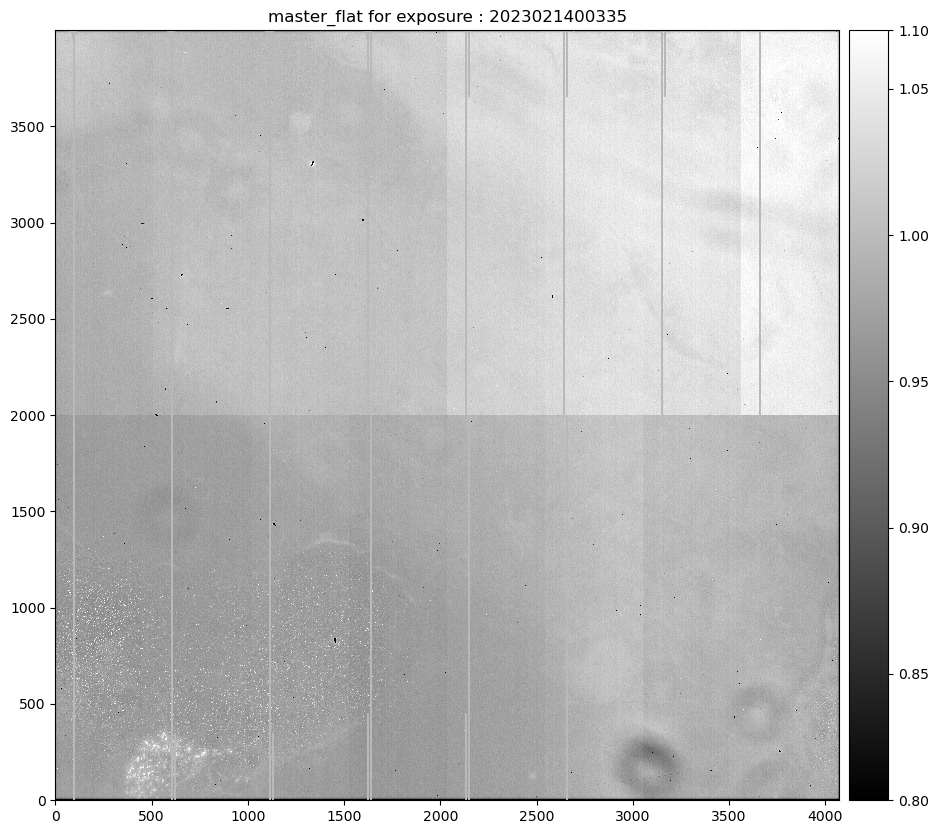

In [12]:
fig = plt.figure(figsize=(12,10))
afw_display = afwDisplay.Display(frame=fig)
afw_display.scale('linear', 'zscale',None)
title = f"master_flat for exposure : {exposure_selected}"
afw_display.mtv(flat_img.image,title=title)

# Extract data from image 
We do this to work with our own tools 

In [13]:
flat_array = flat_img.getImage().array

In [14]:
flat_array.shape

(4000, 4072)

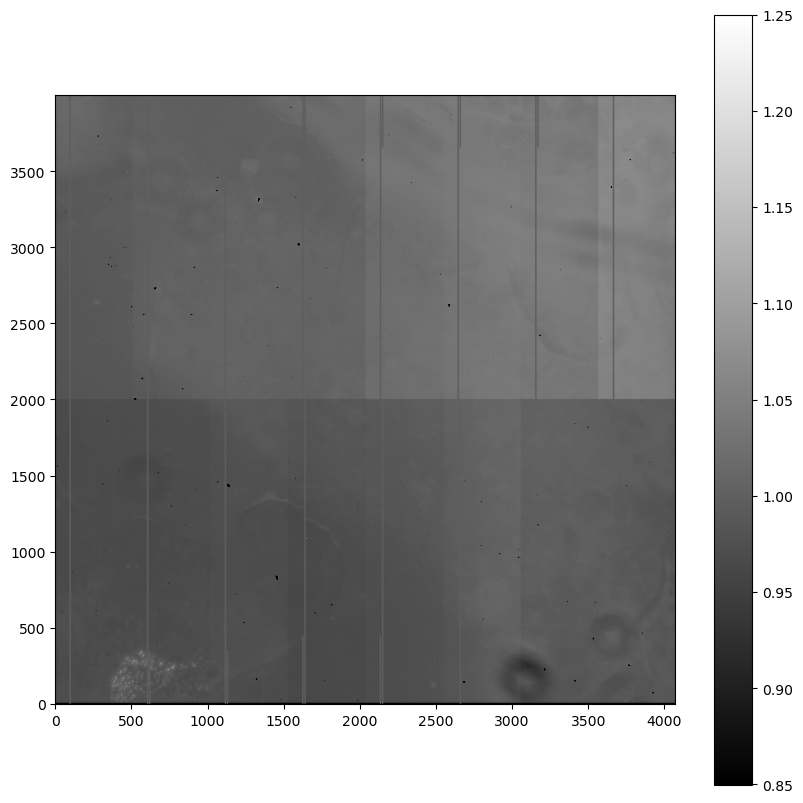

In [15]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(flat_array,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
plt.colorbar(im,ax=ax)
plt.savefig('00_master_flat.png')

In [16]:
flat_img.getDetector()

In [17]:
type(flat_img.getDetector())

lsst.afw.cameraGeom.Detector

In [18]:
flat_img.getDetector().getName()

'RXX_S00'

In [19]:
amplis = list(flat_img.getDetector())
print(amplis)

[<lsst.afw.cameraGeom.Amplifier object at 0x7fb47da7e370>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47da7efb0>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47da7dd70>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47da7e030>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47da7d430>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2f870>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2e8f0>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2d530>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2f4b0>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2db70>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2da30>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2e0b0>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2e630>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2f5b0>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2e770>, <lsst.afw.cameraGeom.Amplifier object at 0x7fb47dc2fab0>]


In [20]:
amplis[0].getName()

'C10'

In [21]:
for ampIdx, amp in enumerate(amplis):
    ampName = amp.getName()
    print(ampIdx,ampName)

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
8 C07
9 C06
10 C05
11 C04
12 C03
13 C02
14 C01
15 C00


Useful documentation: https://pipelines.lsst.io/py-api/lsst.geom.Box2I.html#lsst.geom.Box2I

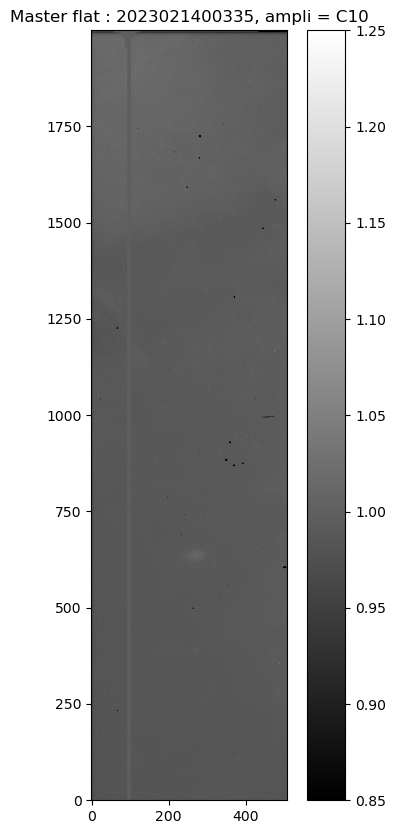

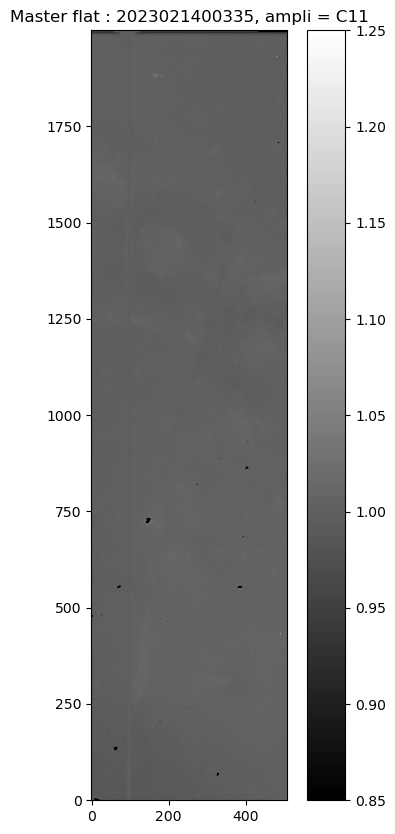

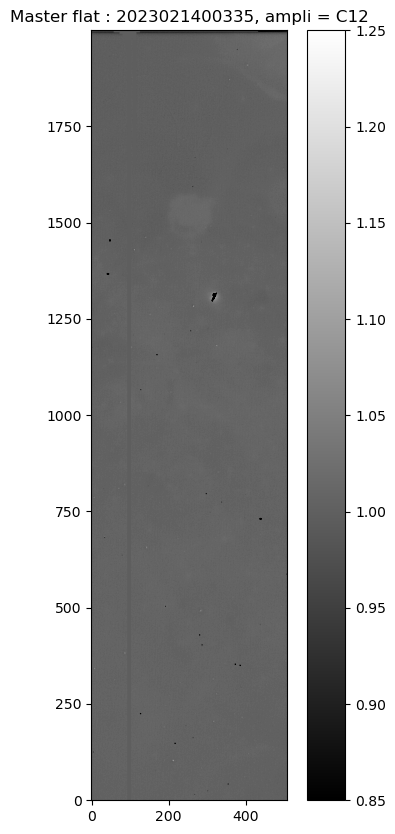

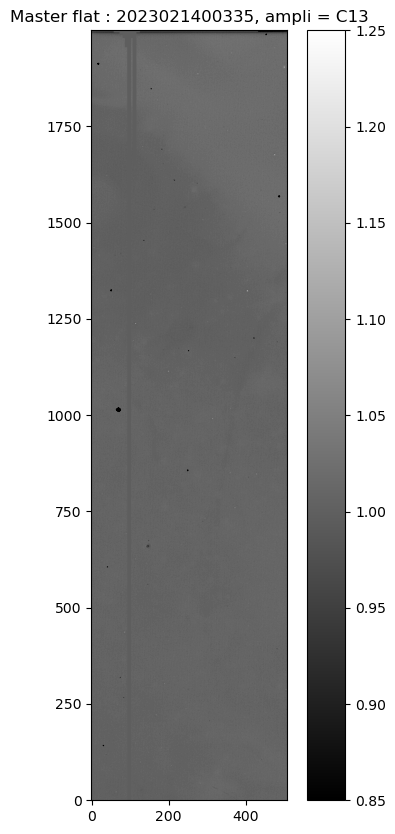

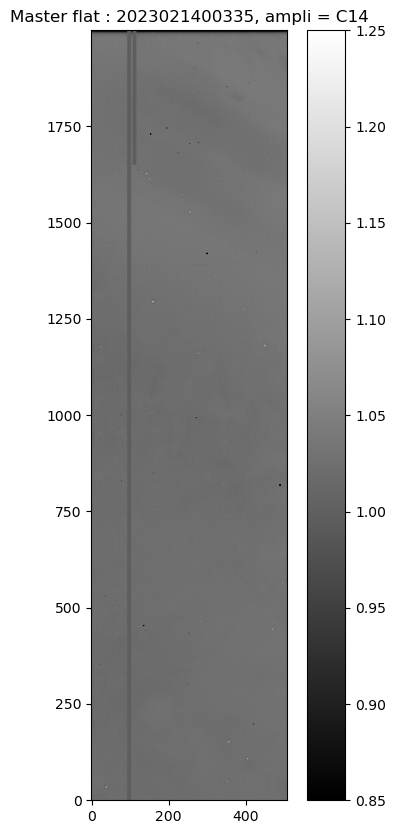

...

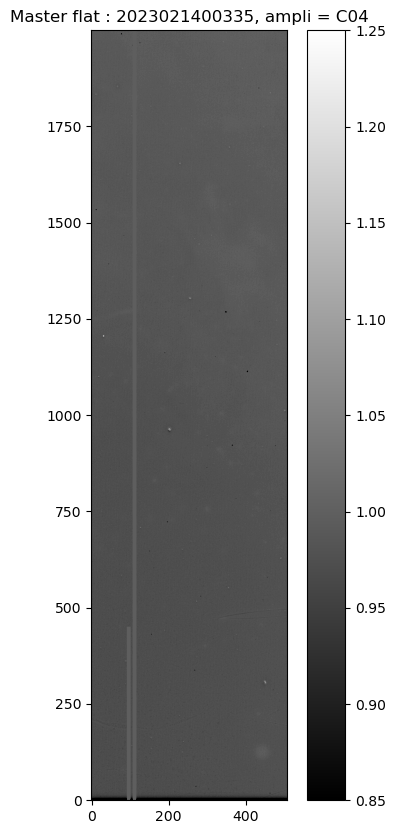

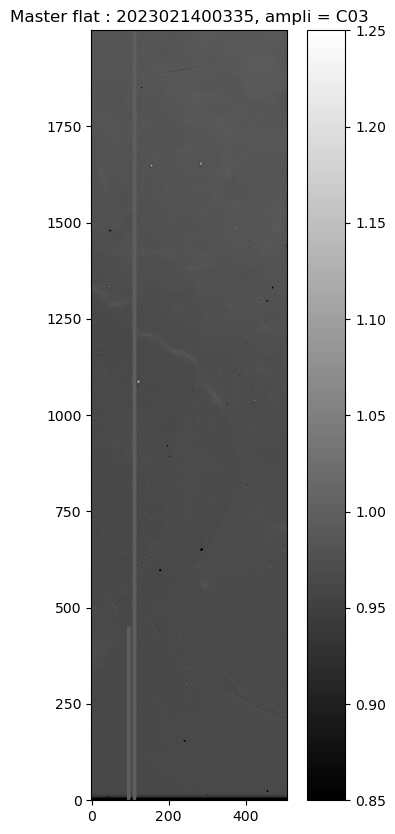

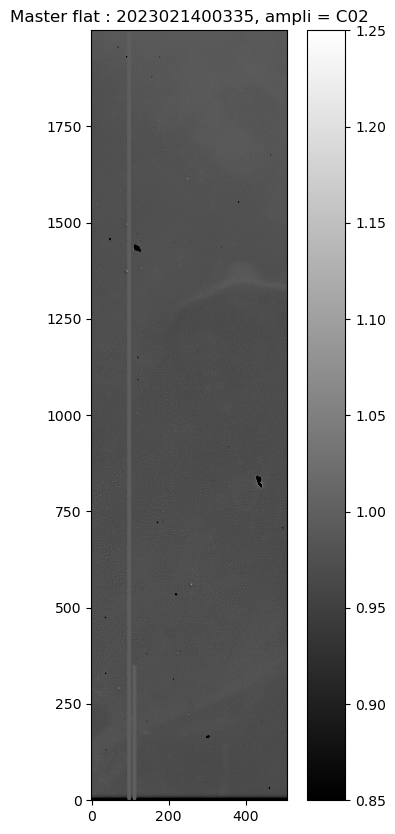

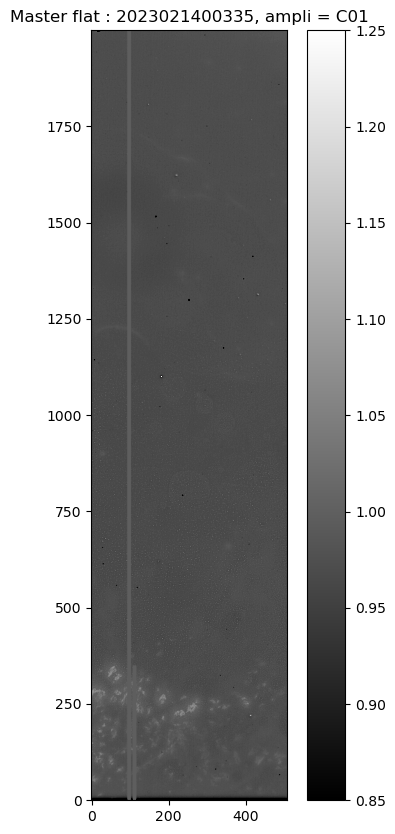

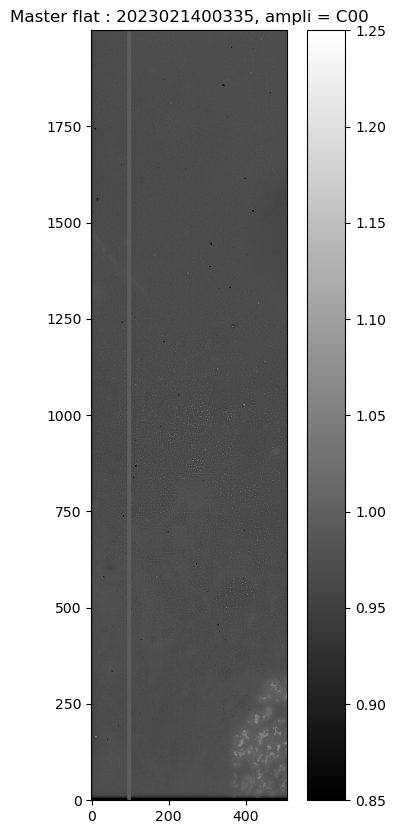

In [22]:
all_img = []
all_nameimg = []
all_boximg = {}

for ampIdx, amp in enumerate(flat_img.getDetector()):
    ampName = amp.getName()
    all_nameimg.append(ampName)
    xbegin = amp.getBBox().x.begin
    xend = amp.getBBox().x.end
    ybegin = amp.getBBox().y.begin
    yend = amp.getBBox().y.end
    all_boximg[ampName] = (xbegin,xend,ybegin,yend)
    
    # This can work only on postISRCCD
    ampExp = flat_img.Factory(flat_img, amp.getBBox())
    amp_img = ampExp.getImage().array
    all_img.append(amp_img) 
    fig = plt.figure(figsize=(5,10))
    ax=fig.add_subplot(111)
    im = ax.imshow(amp_img,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
    title = 'Master flat : {0}, ampli = {1}'.format(exposure_selected,ampName)
    ax.set_title(title)
    fig.colorbar(im,ax=ax)
    '''
    afw_display = afwDisplay.Display(frame=fig)
    afw_display.scale('linear', 'zscale',None)
    title = f"unbiased flat : {exposure_selected}, ampl = {ampName}"
    afw_display.mtv(ampExp.image,title=title)
    '''

In [23]:
all_boximg

{'C10': (0, 509, 2000, 4000),
 'C11': (509, 1018, 2000, 4000),
 'C12': (1018, 1527, 2000, 4000),
 'C13': (1527, 2036, 2000, 4000),
 'C14': (2036, 2545, 2000, 4000),
 'C15': (2545, 3054, 2000, 4000),
 'C16': (3054, 3563, 2000, 4000),
 'C17': (3563, 4072, 2000, 4000),
 'C07': (3563, 4072, 0, 2000),
 'C06': (3054, 3563, 0, 2000),
 'C05': (2545, 3054, 0, 2000),
 'C04': (2036, 2545, 0, 2000),
 'C03': (1527, 2036, 0, 2000),
 'C02': (1018, 1527, 0, 2000),
 'C01': (509, 1018, 0, 2000),
 'C00': (0, 509, 0, 2000)}

## Let's organise the amplifiers separately 

We will work like this except to compute the smooth component, which we compute on the full image to preserve changes between amplifiers (see next point) 

In [24]:
mapampid = [0,1,2,3,4,5,6,7,15,14,13,12,11,10,9,8]

In [25]:
num_amplis = len(mapampid)

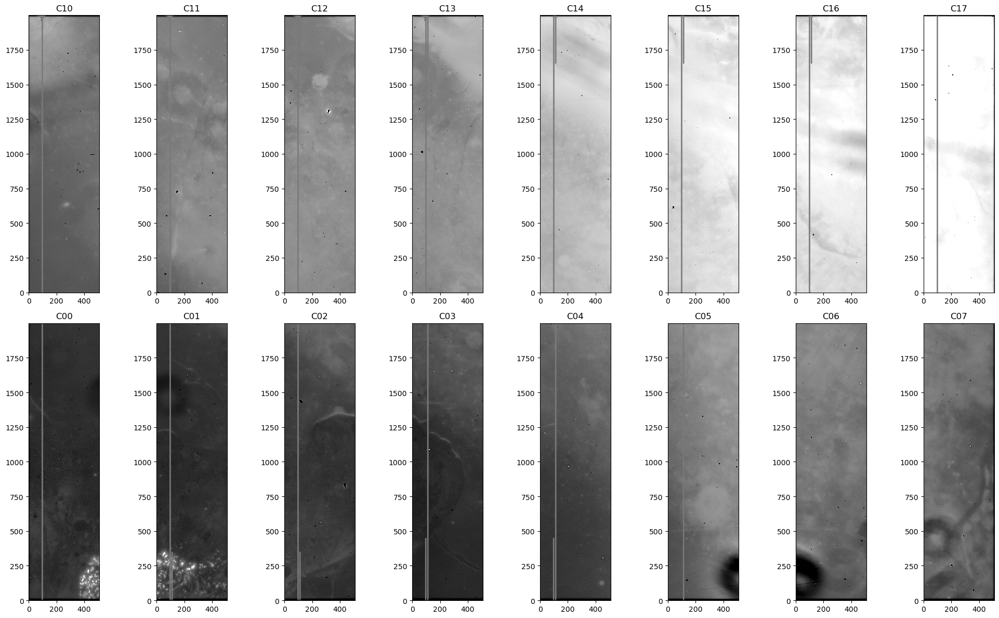

In [26]:
fig=plt.figure(figsize=(20,12))

for idx in range(num_amplis):
    #print(mapampid[idx]+1)
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    ax.imshow(all_img[idx],origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title(all_nameimg[idx])
plt.tight_layout()
plt.savefig('00_master_flat_amplis.png')

Let's look at an single amplifier: 

In [27]:
ampli0_name = 'C00'
id0 = np.where(np.array(all_nameimg)==ampli0_name)[0][0]
print(id0)
ampli0_ = all_img[id0]

15


In [28]:
ampli0_median = np.median(ampli0_.ravel())

We normalise it by its median 

In [29]:
ampli0 = ampli0_/ampli0_median

In [30]:
column1 = 200
column2 = 400
row = 300

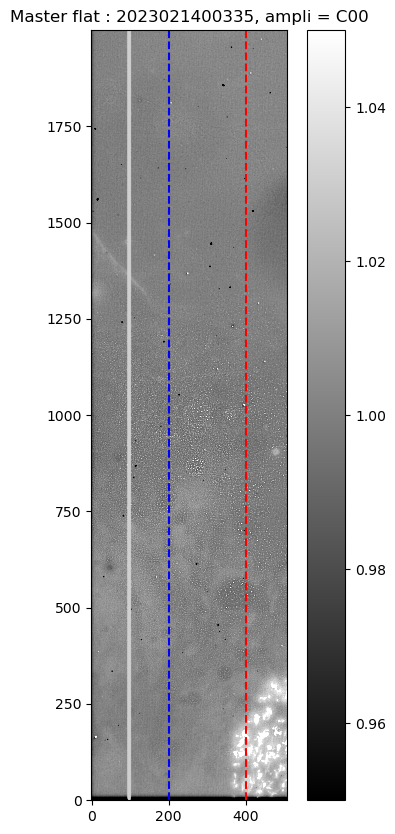

In [31]:
fig = plt.figure(figsize=(5,10))
ax=fig.add_subplot(111)
im = ax.imshow(ampli0,cmap="gray",vmin=0.95,vmax=1.05,origin='lower')#,norm=LogNorm())
ax.axvline(x=column1,ls='--',color='b')
ax.axvline(x=column2,ls='--',color='r')
title = 'Master flat : {0}, ampli = {1}'.format(exposure_selected,ampli0_name)
ax.set_title(title)
fig.colorbar(im,ax=ax)
plt.savefig('00_master_flat_ampli_{0}_columns.png'.format(ampli0_name))

In [32]:
col1_ = ampli0_[10:row,column1]
col2_ = ampli0_[10:row,column2]
col1 = ampli0[10:row,column1]
col2 = ampli0[10:row,column2]

In [33]:
print(len(col1),len(col2))

290 290


In [34]:
col_color = ['b','r']

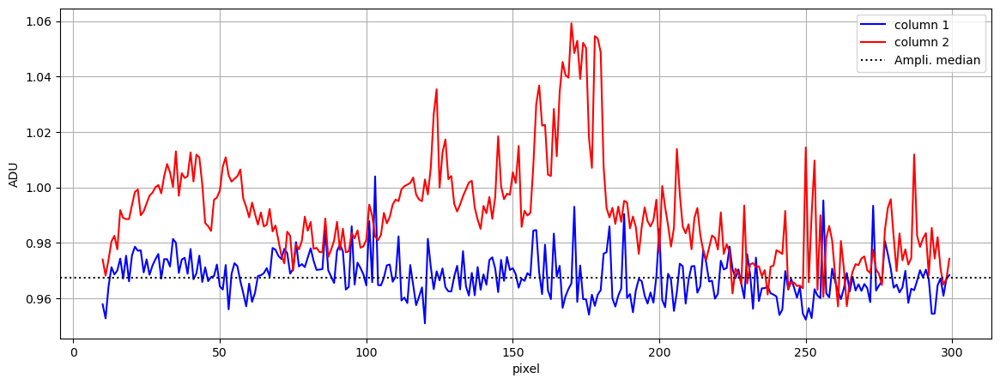

In [35]:
x_ = np.arange(10,10+len(col1))
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(x_,col1_,ls='-',color='b',label='column 1')
ax.plot(x_,col2_,ls='-',color='r',label='column 2')
ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
ax.grid()
ax.set_xlabel('pixel')
ax.set_ylabel('ADU')
ax.legend(loc="best")
plt.savefig('01_columns.png')

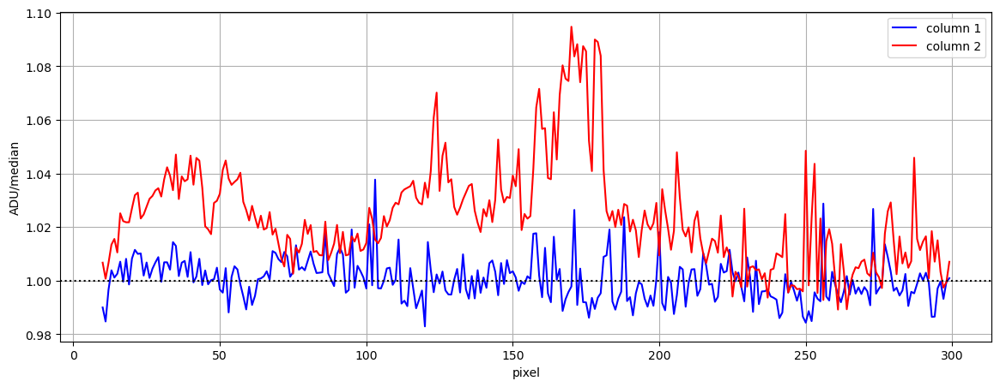

In [36]:
x_ = np.arange(10,10+len(col1))
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(x_,col1,ls='-',color='b',label='column 1')
ax.plot(x_,col2,ls='-',color='r',label='column 2')
ax.axhline(y=1.0,ls=':',color='k')
ax.grid()
ax.set_xlabel('pixel')
ax.set_ylabel('ADU/median')
ax.legend(loc="best")
plt.savefig('01_columns_normalised.png')

# Make median smoothing 

## First, we normalise the each amplifier by its median so we put them at the same level 

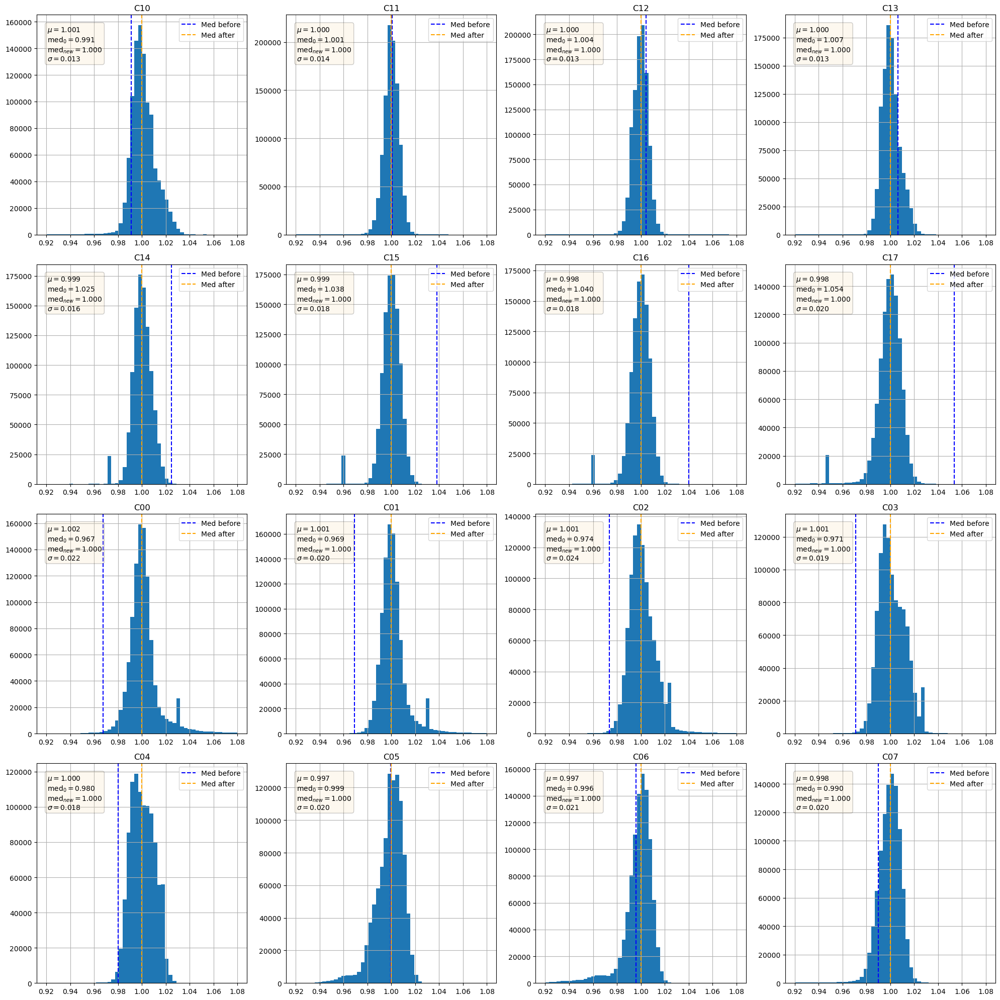

In [37]:
fig=plt.figure(figsize=(20,20))

for idx in range(num_amplis):
    ax=fig.add_subplot(4,4,mapampid[idx]+1)
    
    data_ = all_img[idx].flatten()
    data_median_ = np.median(data_)
    data_ = data_/data_median_
    
    ax.hist(data_,bins=50,range=(0.92,1.08))

    mu = data_.mean()
    median_after = np.median(data_)
    sigma = data_.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}_{0}=%.3f$' % (data_median_, ),
    r'$\mathrm{med}_{new}=%.3f$' % (median_after, ),
    r'$\sigma=%.3f$' % (sigma, )))
    
    ax.axvline(x=data_median_,ls='--',color='b',label='Med before')
    ax.axvline(x=median_after,ls='--',color='orange',label='Med after')
    #ax.set_yscale("log")
    ax.grid()
    ax.set_title(all_nameimg[idx])
    ax.legend(loc="upper right")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
 
plt.tight_layout()
plt.savefig('01_histograms_amplis_normalised.png')

## Now, before making the smoothing, we evaluate whether there is a vertical gradient 

In [38]:
print(ampli0_name,id0)
print(np.median(all_img[id0]))
ampli0_norm = all_img[id0]/np.median(all_img[id0])

C00 15
0.9674984


In [39]:
col1_norm = ampli0_norm[5:,column1]
col2_norm = ampli0_norm[5:,column2]

We group the column values in bins of *delta_pix* size 

In [40]:
delta_pix = 1

In [41]:
vec_median_1 = []
vec_median_2 = []
for i in np.arange(0,len(col1_norm),delta_pix):
    vec_median_1.append(np.median(col1_norm[i:i+delta_pix]))
    vec_median_2.append(np.median(col2_norm[i:i+delta_pix]))
vec_median_1 = np.array(vec_median_1)
vec_median_2 = np.array(vec_median_2)

In [42]:
print(len(vec_median_1),len(vec_median_2))

1995 1995


We select the pixel bins that are within a given $\sigma \, \times$ median (note that, by definition, the global median of each normalised amplifier is 1). Then, we fit those bins to a linear model to characterise the gradient 

In [43]:
sigma_color = {1:'orange',2:'purple',3:'k'}

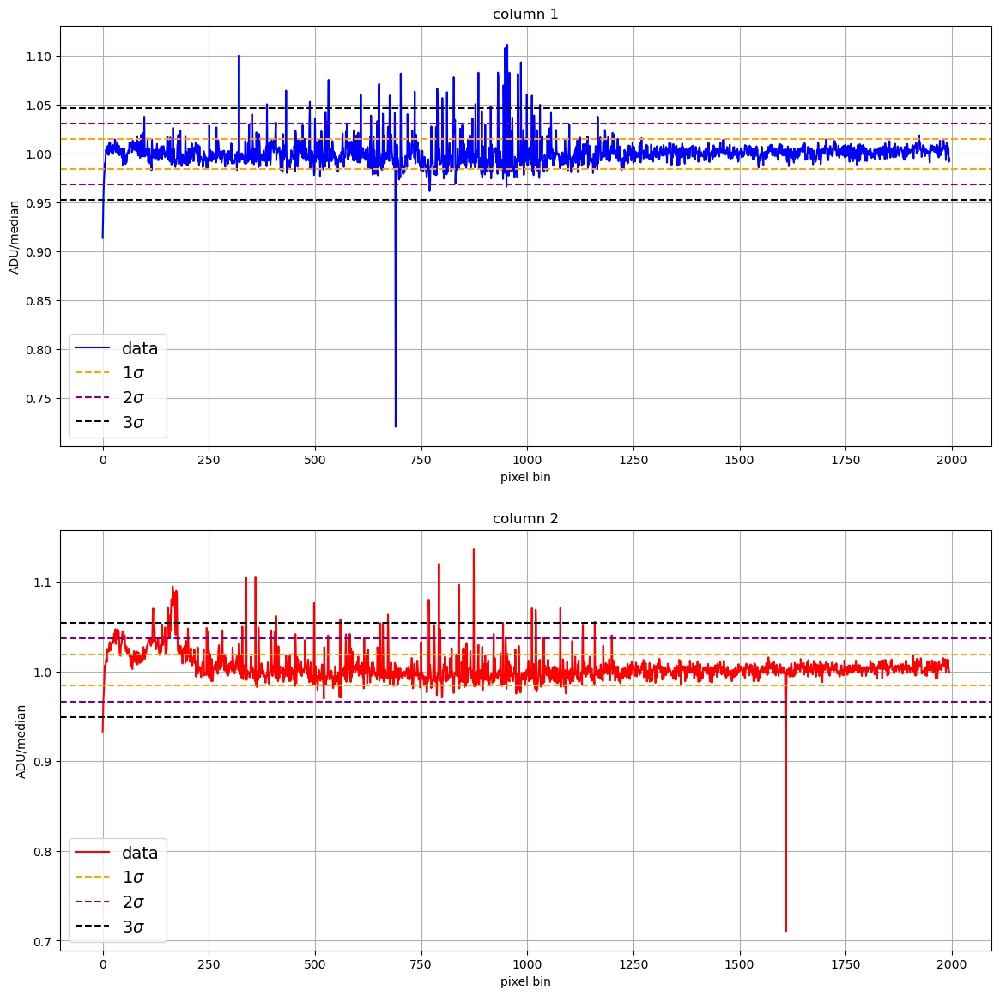

In [44]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    vec_median_ = eval('vec_median_{0}'.format(i))
    
    x_ = np.arange(len(vec_median_))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,vec_median_,ls='-',color=col_color[i-1],label='data')
    
    vec_med_ = np.median(vec_median_)
    vec_std_ = np.std(vec_median_)
    
    for n in range(1,4):
        ax.axhline(y=vec_med_-n*vec_std_,ls='--',color=sigma_color[n])
        ax.axhline(y=vec_med_+n*vec_std_,ls='--',color=sigma_color[n])
        #ax.axhline(y=1.-n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        #ax.axhline(y=1.+n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        ax.plot([],[],ls='--',color=sigma_color[n],label='{0}'.format(n)+r'$\sigma$')
    
    #ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel bin')
    ax.set_ylabel('ADU/median')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best",fontsize=14)

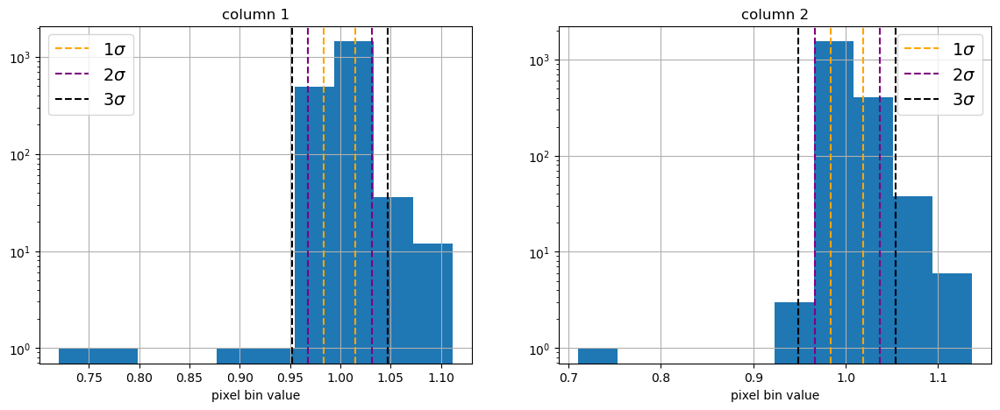

In [45]:
fig = plt.figure(figsize=(14,5))
for i in range(1,3):
    vec_median_ = eval('vec_median_{0}'.format(i))
    
    ax=fig.add_subplot(1,2,i)
    ax.hist(vec_median_)
    
    vec_med_ = np.median(vec_median_)
    vec_std_ = np.std(vec_median_)
    
    for n in range(1,4):
        #print(1.-n*np.std(vec_median_))
        ax.axvline(x=vec_med_-n*vec_std_,ls='--',color=sigma_color[n])
        ax.axvline(x=vec_med_+n*vec_std_,ls='--',color=sigma_color[n])
        #ax.axvline(x=1.-n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        #ax.axvline(x=1.+n*np.std(ampli0_norm),ls='--',color=sigma_color[n])
        ax.plot([],[],ls='--',color=sigma_color[n],label='{0}'.format(n)+r'$\sigma$')
    
    #ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.set_yscale("log")
    ax.grid()
    ax.set_xlabel('pixel bin value')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best",fontsize=14)

We define a simple linear function to fit the trend and later remove the potential gradient 

In [46]:
def grad_model(x,a,b):
    return a*x+b

We select $\sigma = 1$ 

In [47]:
sigma_fit = 1.

In [48]:
vec_med_1 = np.median(vec_median_1)
vec_med_2 = np.median(vec_median_2)
vec_std_1 = np.std(vec_median_1)
vec_std_2 = np.std(vec_median_2)

sigma_mask1 = (vec_median_1>=vec_med_1-sigma_fit*vec_std_1)*(vec_median_1<=vec_med_1+sigma_fit*vec_std_1)
sigma_mask2 = (vec_median_2>=vec_med_2-sigma_fit*vec_std_2)*(vec_median_2<=vec_med_2+sigma_fit*vec_std_2)

In [49]:
x1_fit = np.arange(len(vec_median_1))[sigma_mask1]
x2_fit = np.arange(len(vec_median_2))[sigma_mask2]
vec_median_1_fit = vec_median_1[sigma_mask1]
vec_median_2_fit = vec_median_2[sigma_mask2]

In [50]:
param1,cov1 = curve_fit(grad_model,x1_fit,vec_median_1_fit)
param2,cov2 = curve_fit(grad_model,x2_fit,vec_median_2_fit)

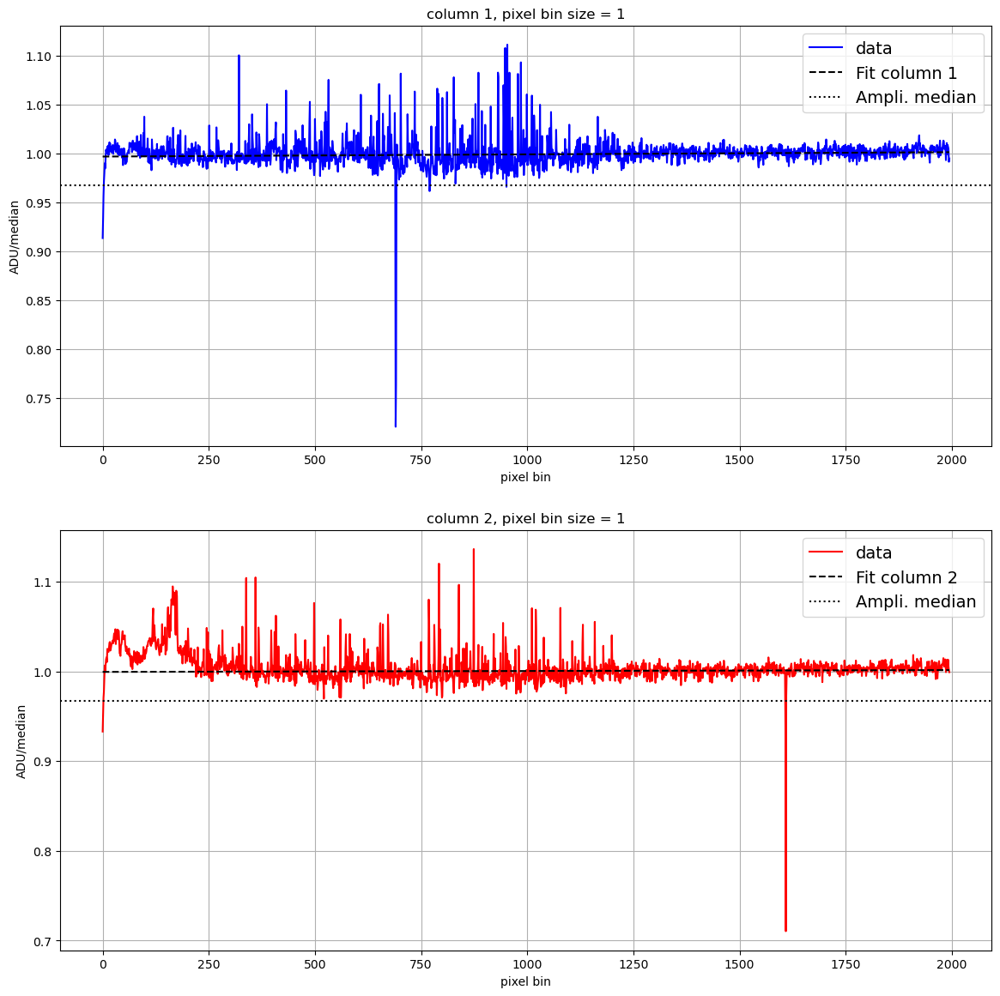

In [51]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    vec_median_ = eval('vec_median_{0}'.format(i))
    params_ = eval('param{0}'.format(i))
    
    x_ = np.arange(len(vec_median_))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,vec_median_,ls='-',color=col_color[i-1],label='data')
    ax.plot(x_,grad_model(x_,params_[0],params_[1]),ls='--',color='k',label='Fit column {0}'.format(i))
    
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel bin')
    ax.set_ylabel('ADU/median')
    ax.set_title('column {0}, pixel bin size = {1}'.format(i,delta_pix))
    ax.legend(loc="best",fontsize=14)

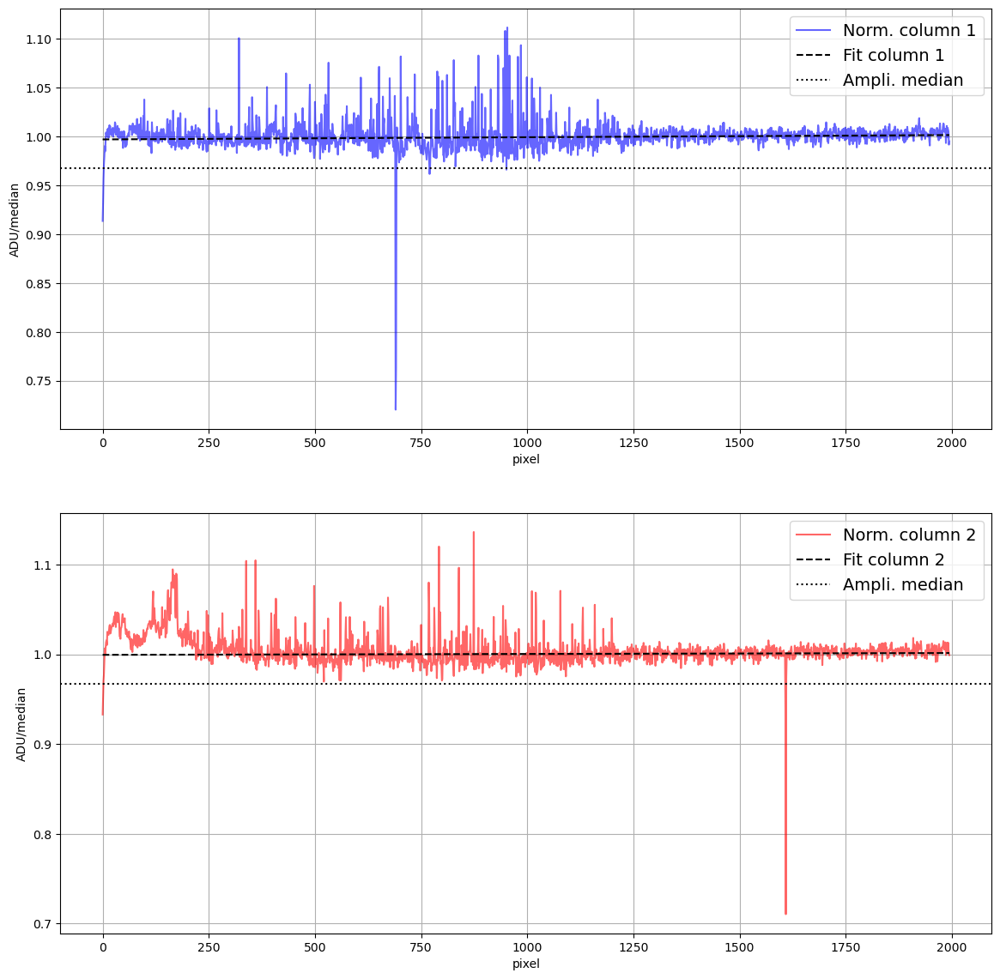

In [52]:
fig = plt.figure(figsize=(14,14))

for i in range(1,3):
    col_norm_ = eval('col{0}_norm'.format(i))
    params_ = eval('param{0}'.format(i))
    
    x_ = np.arange(len(col_norm_))

    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_norm_,ls='-',color=col_color[i-1],alpha=0.6,label='Norm. column {0}'.format(i))
    ax.plot(x_,grad_model(x_,params_[0],params_[1]),ls='--',color='k',label='Fit column {0}'.format(i))
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    #ax.set_ylim(0.95,1.05)
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_ylabel('ADU/median')
    ax.legend(loc="best",fontsize=14)

In [53]:
ampli0.shape

(2000, 509)

## Now let's do this process for all columns of all amplis: 

1. Normalise each amplifier by its median value 
2. For each column, bin the pixel values in bins of *delta_pix* size (note that this may be equal to 1, that is, we don't bin) and reject the values out of $[median - n \cdot \sigma, median + n \cdot \sigma]$, with $\sigma$ the standard deviation of each column 
3. Fit those values with a linear function 
4. Devide each column by the fit, so we remove any (vertical) gradient there may be 
5. Store the new image in an array 

In [54]:
print(delta_pix)
print(sigma_fit)

1
1.0


In [55]:
load_norm_flat = True

In [56]:
if load_norm_flat:
    norm_array = np.load('ccd_median_normalised.npy')
else:
    for iampli in mapampid:
        #iampli = mapampid[idx]
        iampli_name = all_nameimg[iampli]
        print(iampli,iampli_name)
        
        amp_data = np.copy(all_img[iampli])
        amp_median = np.median(all_img[iampli].flatten())
        amp_norm_ = amp_data/amp_median
        amp_norm = np.zeros((amp_norm_.shape[0],amp_norm_.shape[1]))
        
        #col1_norm = ampli0_norm[5:,column1]
        '''
        for icolumn in range(amp_norm_.shape[1]):
            coli_norm = amp_norm_[:,icolumn]
            vec_median_i = []
            for i in np.arange(0,len(coli_norm),delta_pix):
                vec_median_i.append(np.median(coli_norm[i:i+delta_pix]))
            vec_median_i = np.array(vec_median_i)
            
            vec_med_i = np.median(vec_median_i)
            vec_std_i = np.std(vec_median_i)
            
            sigma_mask_i = (vec_median_i>=vec_med_i-sigma_fit*vec_std_i)*(vec_median_i<=vec_med_i+sigma_fit*vec_std_i)
            
            xi_fit = np.arange(len(vec_median_i))[sigma_mask_i]
            vec_median_i_fit = vec_median_i[sigma_mask_i]
            
            parami,covi = curve_fit(grad_model,xi_fit,vec_median_i_fit)
            
            xi_ = np.arange(len(coli_norm))
            modeli = grad_model(xi_,parami[0],parami[1])
            
            amp_norm[:,icolumn] = coli_norm/modeli
        '''
        amp_norm = amp_norm_
        
        if iampli<=7:
            if iampli==0:
                data_up = amp_norm
            else:
                data_up = np.concatenate((data_up,amp_norm),axis=1)
        else:
            if iampli==15:
                data_down = amp_norm
            else:
                data_down = np.concatenate((data_down,amp_norm),axis=1)
    norm_array = np.concatenate((data_down,data_up),axis=0)
    np.save('ccd_median_normalised.npy',norm_array)
    

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
15 C00
14 C01
13 C02
12 C03
11 C04
10 C05
9 C06
8 C07


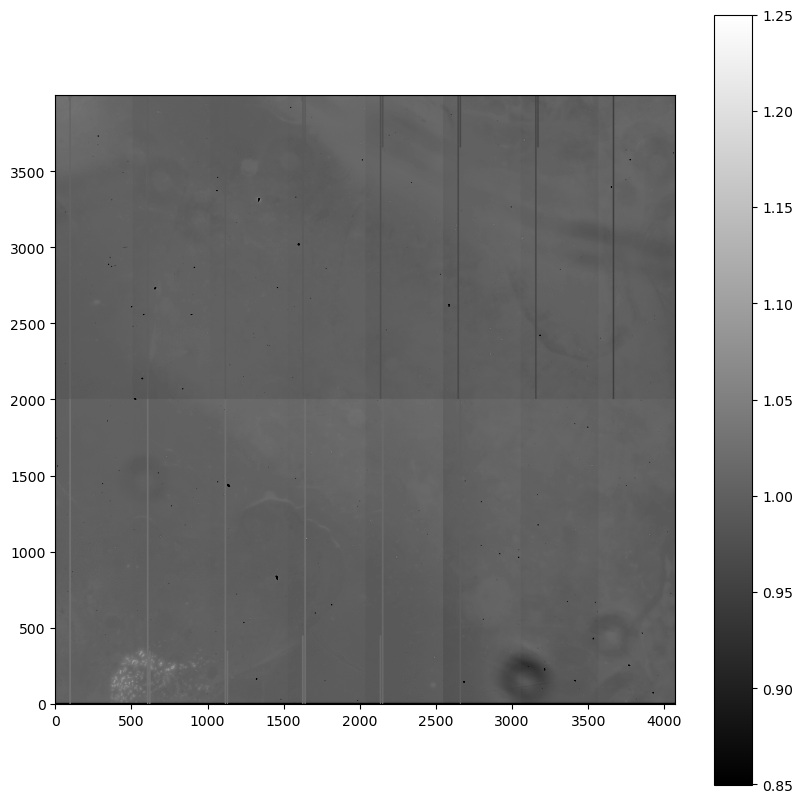

In [57]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(norm_array,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
plt.colorbar(im,ax=ax)
plt.savefig('02_normalised_flat.png')

## Now we apply the smoothing on the normalised and detrended flat 

We try different window sizes for the median smoothing: 

In [58]:
window_sizes = np.array([2,5,10,20,30,40,50])

In [80]:
# Set this to True if the smoothed flats were not computed before 
load_smooths = True

In [60]:
if load_smooths:
    smooth_list_ws = np.load('smoothed_flats.npy')[0]
else:
    smooth_list_ws = []
    for ws in window_sizes:
        print(ws)
        smooth_ws = ndimage.median_filter(norm_array,size=ws)
        smooth_list_ws.append(smooth_ws)
    np.save('smoothed_flats.npy',[smooth_list_ws])

2
5
10
20
30
40
50


Now we look at the smoothed image on our reference amplifier with the different window size values 

In [61]:
all_boximg[ampli0_name]

(0, 509, 0, 2000)

In [62]:
test_ws = 40

In [63]:
x0 = all_boximg[ampli0_name][0]
x1 = all_boximg[ampli0_name][1]
y0 = all_boximg[ampli0_name][2]
y1 = all_boximg[ampli0_name][3]

smooth0 = smooth_list_ws[np.where(window_sizes==test_ws)[0][0]][y0:y1,x0:x1]

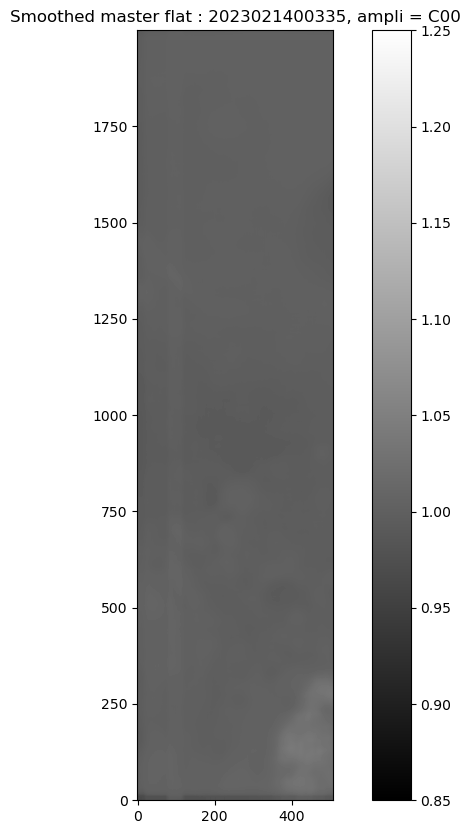

In [64]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(smooth0,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
title = 'Smoothed master flat : {0}, ampli = {1}'.format(exposure_selected,ampli0_name)
ax.set_title(title)
plt.colorbar(im,ax=ax)

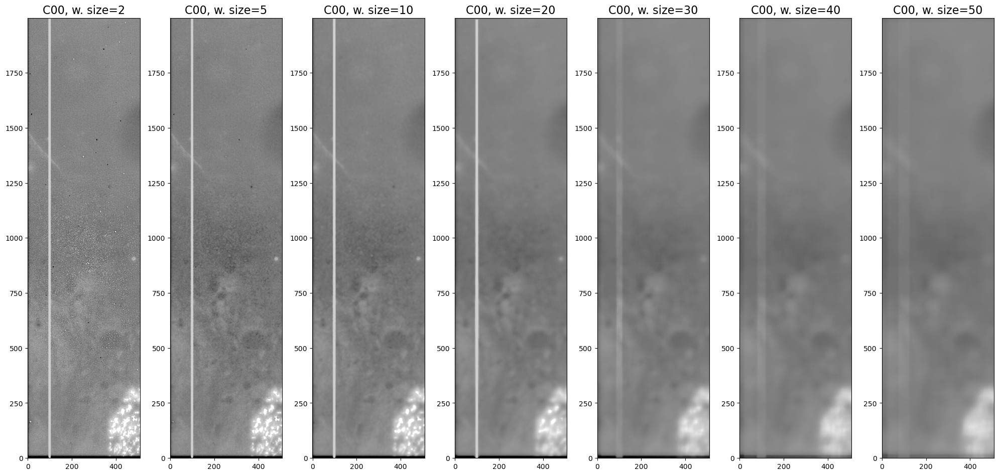

In [79]:
fig=plt.figure(figsize=(20,12))
for ismooth in range(len(window_sizes)):
    ax=fig.add_subplot(1,len(window_sizes),ismooth+1)
    smooth_ = smooth_list_ws[ismooth][y0:y1,x0:x1]
    ax.imshow(smooth_,origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title('{0}, w. size={1}'.format(ampli0_name,window_sizes[ismooth]),fontsize=16)
plt.tight_layout()
plt.savefig('03_smoothed_flat_window_sizes.png')

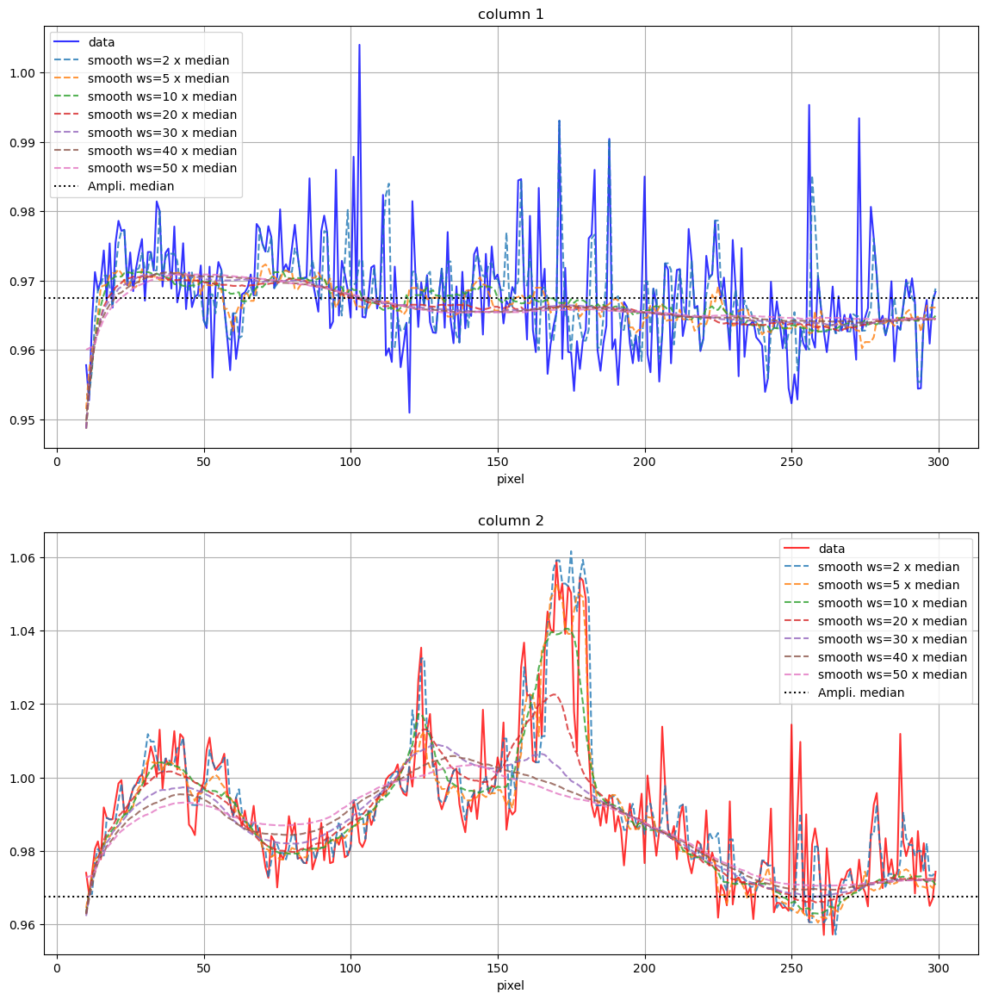

In [81]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col_))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],alpha=0.8,label='data'.format(i))
    for iws,ws in enumerate(window_sizes):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_smooth_*ampli0_median,ls='--',alpha=0.8,label='smooth ws={1} x median'.format(i,ws))
    
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")
plt.savefig('03_columns_window_sizes.png')

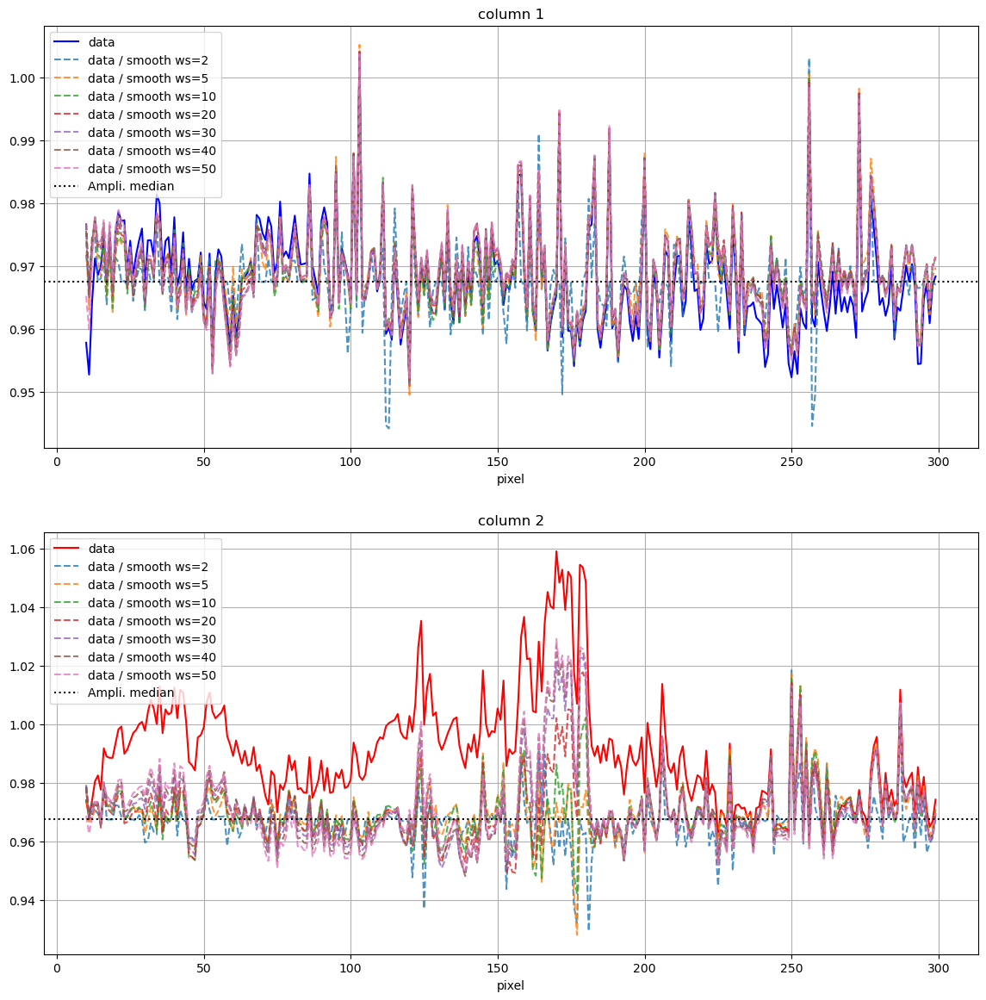

In [67]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    for iws,ws in enumerate(window_sizes):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(ws))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")
plt.savefig('03')

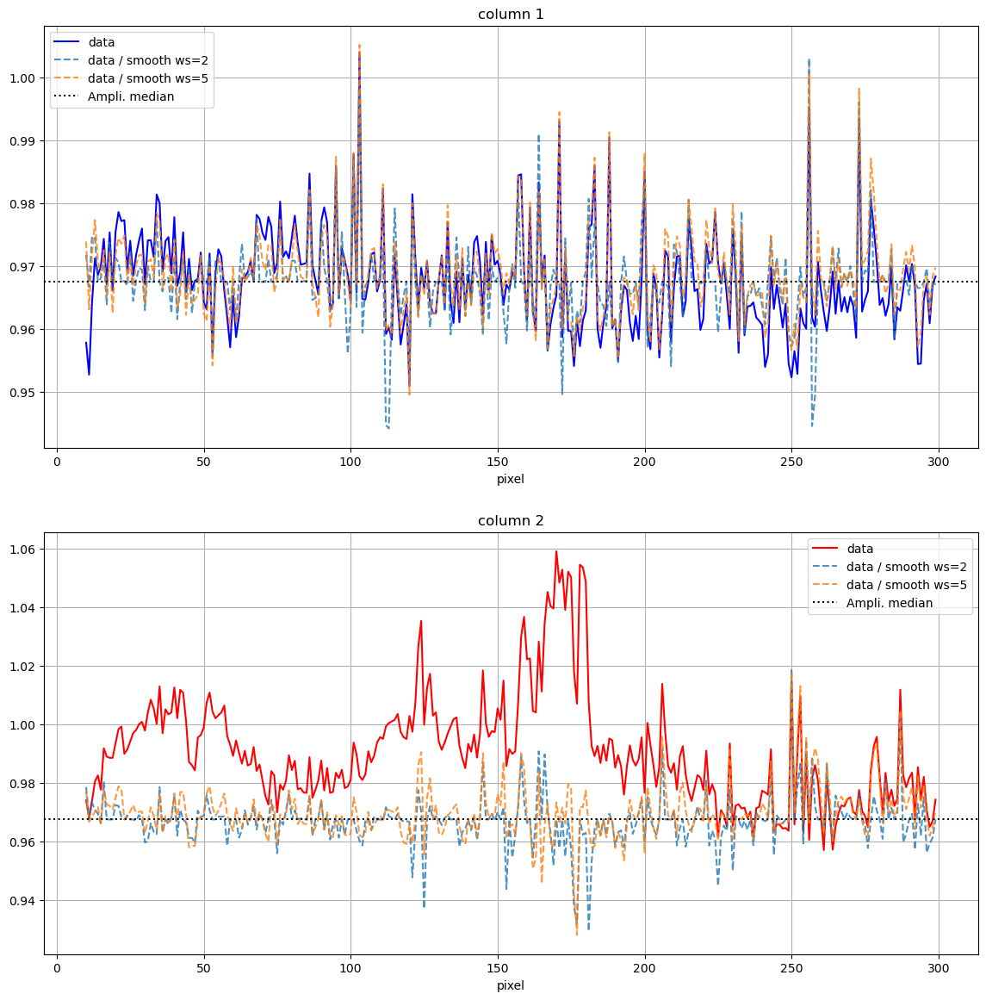

In [68]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    for iws,ws in enumerate(window_sizes[:2]):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(ws))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")

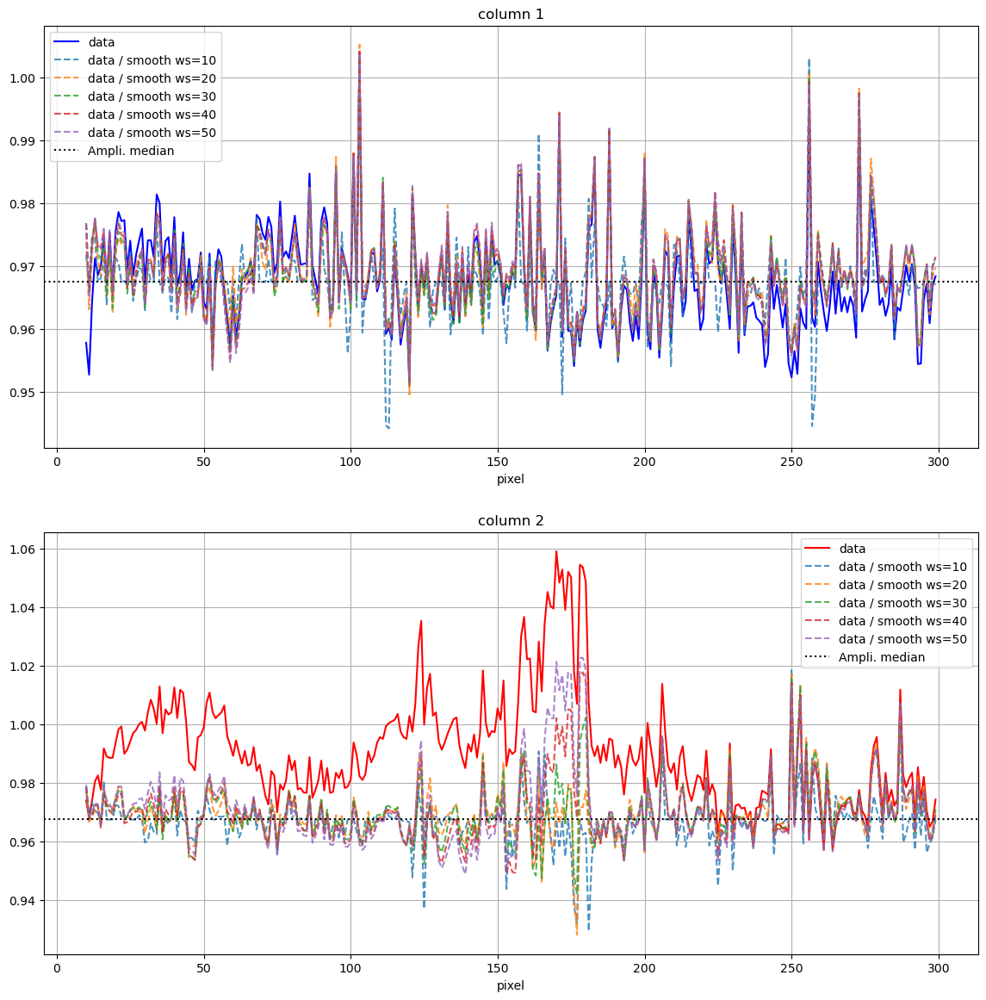

In [69]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    for iws,ws in enumerate(window_sizes[2:]):
        col_smooth_ = smooth_list_ws[iws][y0:y1,x0:x1][10:row,column_]
        ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(ws))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")

## The effect of the window size for the values selected does not seem very important. We select a value of 40 

In [70]:
window_size = 40

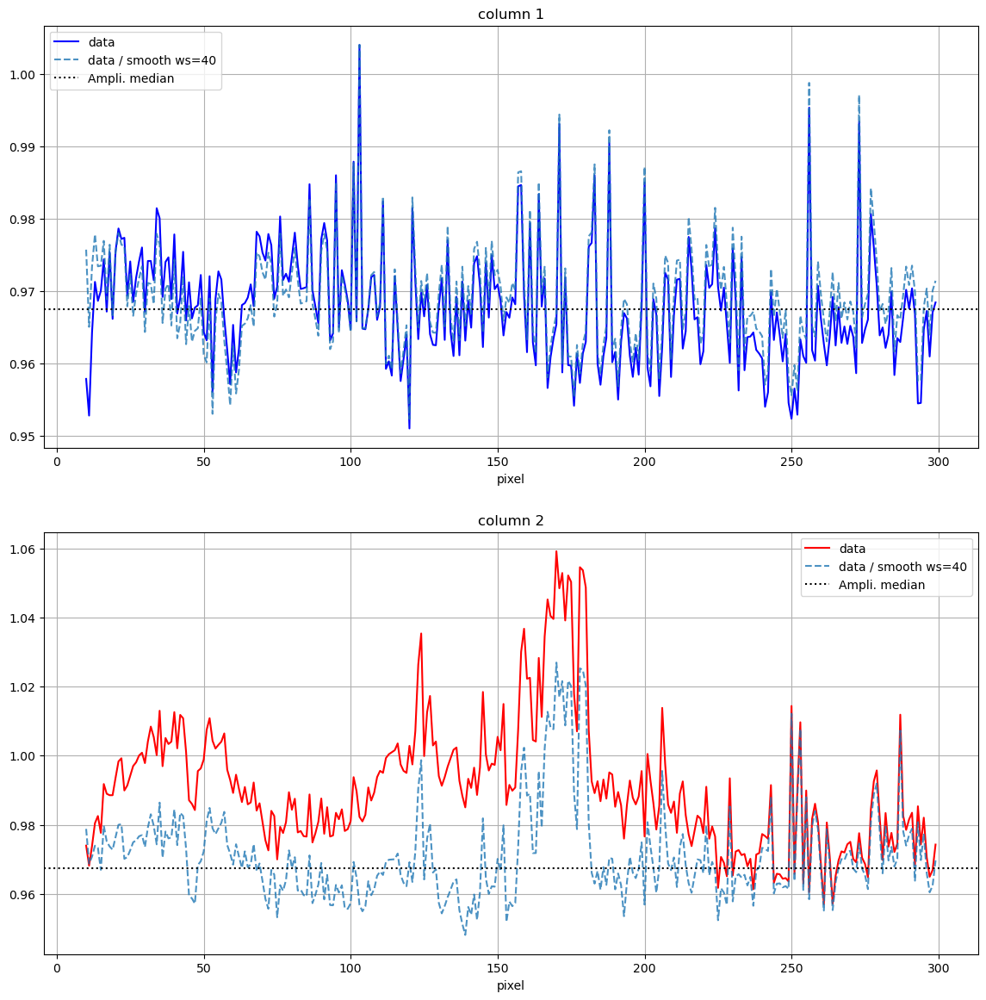

In [82]:
fig = plt.figure(figsize=(14,14))
for i in range(1,3):
    column_ = eval('column{0}'.format(i))
    col_ = eval('col{0}_'.format(i))
    
    x_ = np.arange(10,10+len(col2))
    ax=fig.add_subplot(2,1,i)
    ax.plot(x_,col_,ls='-',color=col_color[i-1],label='data')
    
    ws_index = np.where(window_sizes==window_size)[0][0]
    col_smooth_ = smooth_list_ws[ws_index][y0:y1,x0:x1][10:row,column_]
    ax.plot(x_,col_/col_smooth_,ls='--',alpha=0.8,label='data / smooth ws={0}'.format(window_size))
        
    ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
    ax.grid()
    ax.set_xlabel('pixel')
    ax.set_title('column {0}'.format(i))
    ax.legend(loc="best")
plt.savefig('04_columns_deflatened_ws{0}.png'.format(window_size))

We store the smoothed image separately for each amplifier: 

In [72]:
smooth_list = []
for ampli_name_ in all_nameimg:
    print(ampli_name_)
    
    x0_ = all_boximg[ampli_name_][0]
    x1_ = all_boximg[ampli_name_][1]
    y0_ = all_boximg[ampli_name_][2]
    y1_ = all_boximg[ampli_name_][3]
    
    smooth_i_ = smooth_list_ws[np.where(window_sizes==window_size)[0][0]][y0_:y1_,x0_:x1_]
    smooth_list.append(smooth_i_)
    

C10
C11
C12
C13
C14
C15
C16
C17
C07
C06
C05
C04
C03
C02
C01
C00


We show the smoothed images of each amplifier 

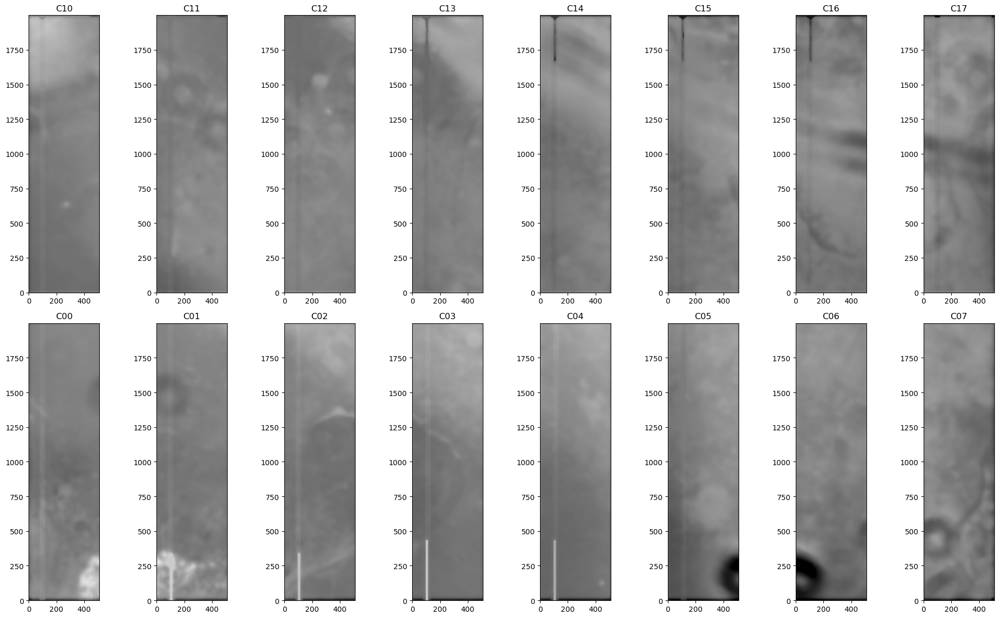

In [83]:
fig=plt.figure(figsize=(20,12))
for idx in range(num_amplis):
    
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    ax.imshow(smooth_list[idx],origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title(all_nameimg[idx])
plt.tight_layout()
plt.savefig('04_smooth_component_ws{0}.png'.format(window_size))

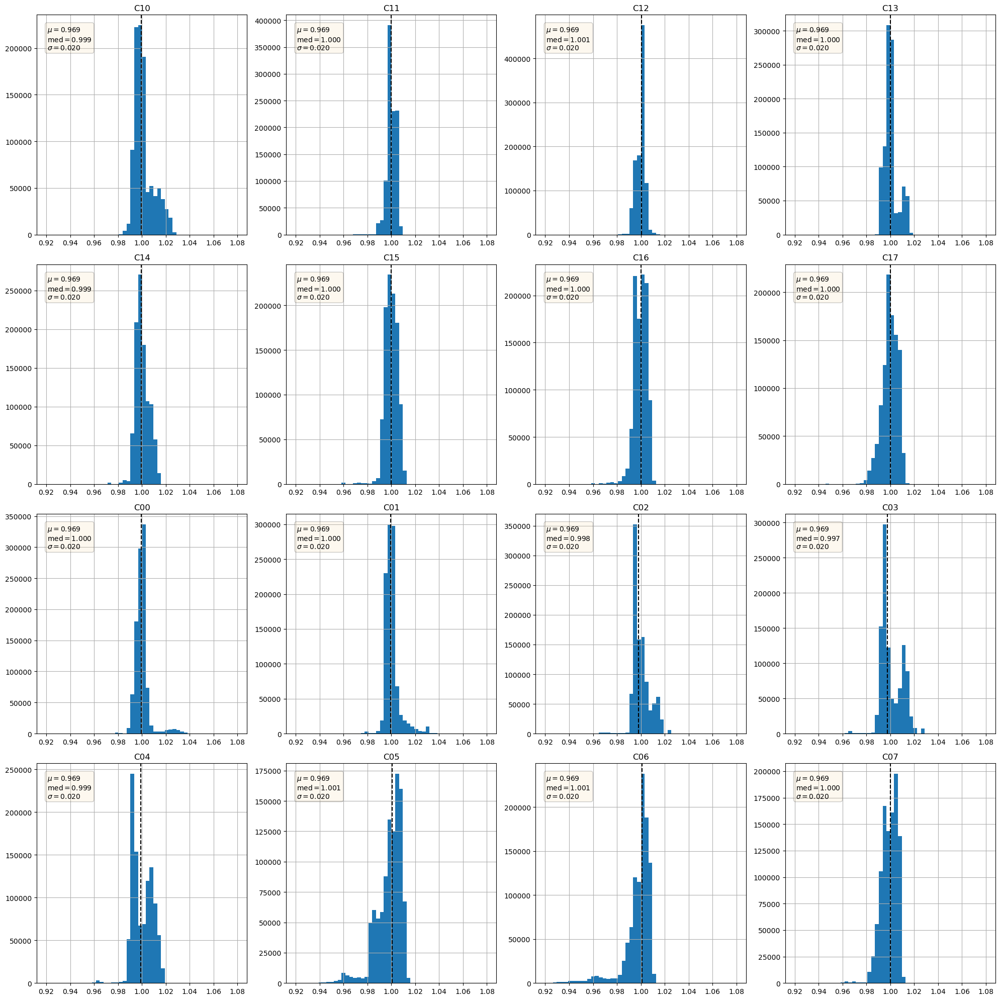

In [84]:
fig=plt.figure(figsize=(20,20))

for idx in range(num_amplis):
    ax=fig.add_subplot(4,4,mapampid[idx]+1)
    
    data_smooth_ = smooth_list[idx].flatten()
    amp_median_ = np.median(data_smooth_)
    
    ax.hist(data_smooth_,bins=50,range=(0.92,1.08),alpha=1.0)

    mu = data_.mean()
    sigma = data_.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}=%.3f$' % (amp_median_, ),
    r'$\sigma=%.3f$' % (sigma, )))
    
    ax.axvline(x=amp_median_,ls='--',color='k')
    ax.grid()
    ax.set_title(all_nameimg[idx])  
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
 
plt.tight_layout()
plt.savefig('04_smooth_component_histogram_ws{0}.png'.format(window_size))

And now we show the result of doing 

$$F_i^{\prime} = \frac{F_i}{S_i} \, ,$$

with $i$ running over the amplifiers. 

Since we have made the smoothing on the full image obtained after normalising each amplifier by its median, we DO NOT need to rescale the flat back to the original **global** median value by multiplying by it. 

NOTE: 

If we did not do this, then we would be dividing by the median smoothed images which preserve their own levels, so we would be approximately normalizing by the median, needing therefore to rescale it back to the original **global** median value by multiplying by it (all this is meant to be ampli by ampli). In reality, when dividing by the median smoothed images we would divide by a **spatially** dependent median, not the global one, so any slowly varying feature, such as a gradient, would be removed and it would not be recovered by simply multiplying by the original global median. We investigate this later. 

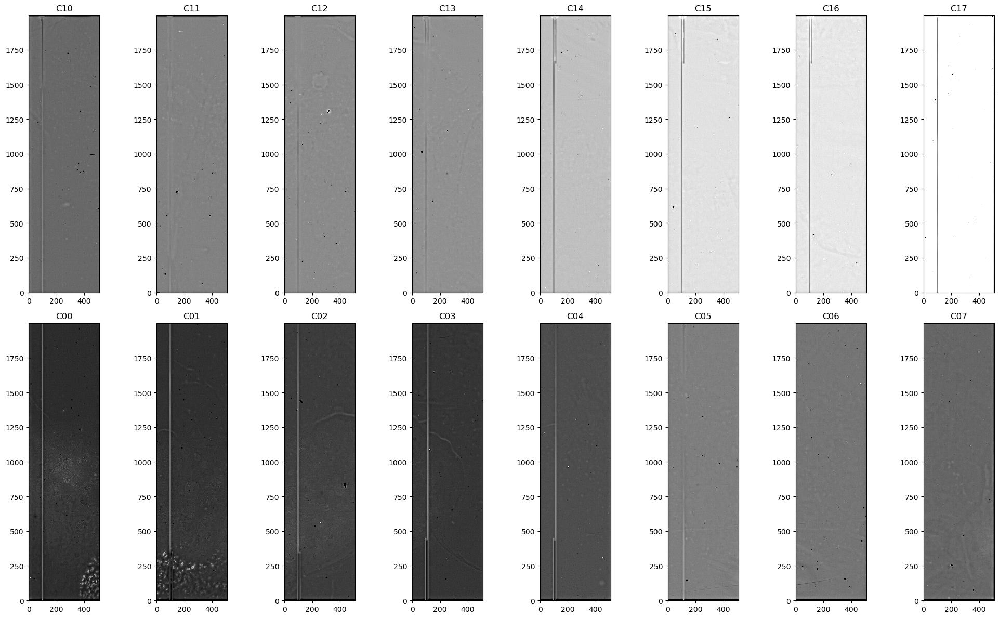

In [85]:
fig=plt.figure(figsize=(20,12))

for idx in range(num_amplis):
    ax=fig.add_subplot(2,8,mapampid[idx]+1)
    
    #amp_median = np.median(all_img[idx].flatten())
    
    ax.imshow(all_img[idx]/smooth_list[idx],origin='lower',vmin=0.95,vmax=1.05,cmap="gray")
    ax.set_title(all_nameimg[idx])
plt.tight_layout()
plt.savefig('04_special_flat_amplis_ws{0}.png'.format(window_size))

Let's see the distribution of the pixel values for each amplifier after removing the smooth components: 

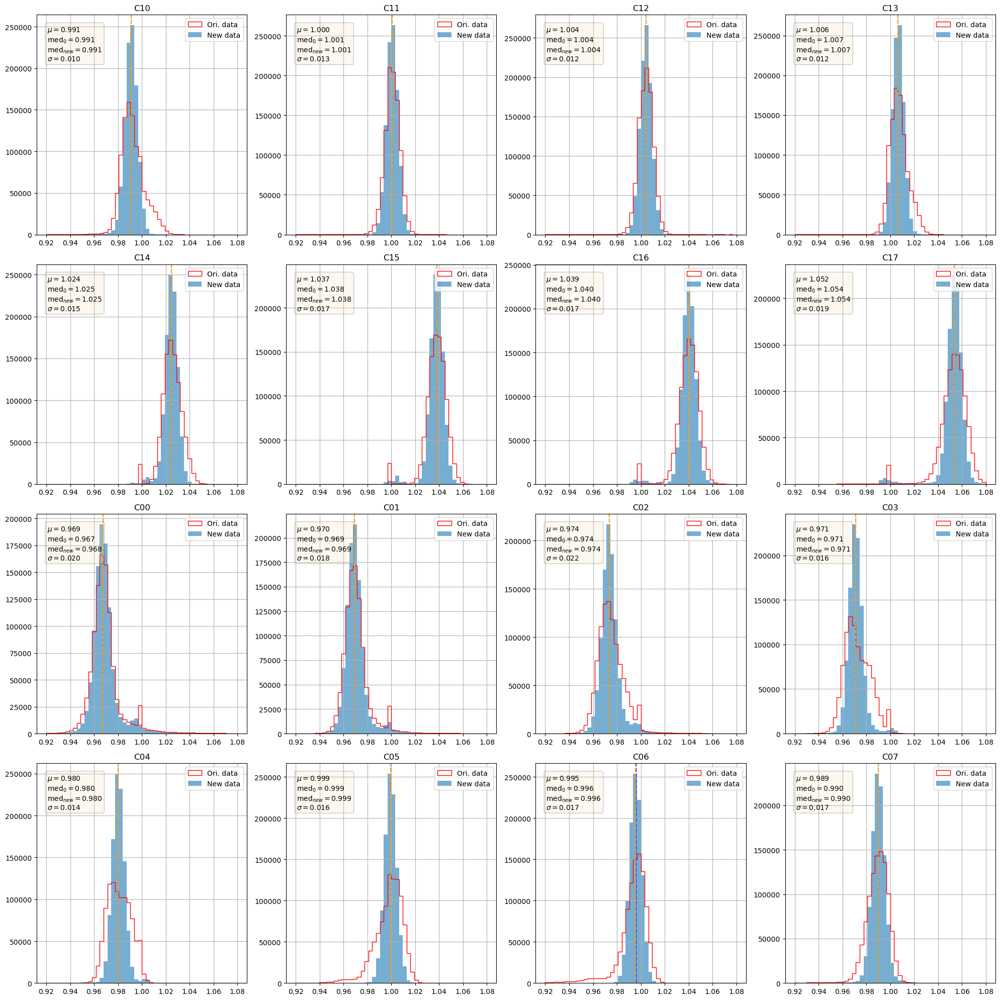

In [86]:
fig=plt.figure(figsize=(20,20))

for idx in range(num_amplis):
    ax=fig.add_subplot(4,4,mapampid[idx]+1)
    
    data0_ = all_img[idx].flatten()
    amp_median = np.median(data0_)
    
    data_ = all_img[idx].flatten()/smooth_list[idx].flatten()
    
    ax.hist(data0_,bins=50,range=(0.92,1.08),histtype='step',color='r',label='Ori. data')
    ax.hist(data_,bins=50,range=(0.92,1.08),alpha=0.6,label='New data')

    mu = data_.mean()
    median_after = np.median(data_)
    sigma = data_.std()
    textstr = '\n'.join((
    r'$\mu=%.3f$' % (mu, ),
    r'$\mathrm{med}_{0}=%.3f$' % (amp_median, ),
    r'$\mathrm{med}_{new}=%.3f$' % (median_after, ),
    r'$\sigma=%.3f$' % (sigma, )))
    
    ax.axvline(x=amp_median,ls='--',color='b')
    ax.axvline(x=median_after,ls='--',color='orange')
    ax.grid()
    ax.set_title(all_nameimg[idx])
    ax.legend(loc="upper right")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.2)

    # place a text box in upper left in axes coords
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,verticalalignment='top', bbox=props)
    
 
plt.tight_layout()
plt.savefig('04_histograms_special_flat_amplis_ws{0}.png'.format(window_size))

We store the special flat in an array 

In [87]:
md = flat_img.getMetadata().toDict()
filter_ = md['FILTER']

In [88]:
load_special_flat = False

In [89]:
if load_special_flat:
    special_array = np.load(os.path.join(outdir,'special_flat_median_normalised_{0}_{1}.npy').format(exposure_selected,filter_))

else:
    for iampli in mapampid:
        iampli_name = all_nameimg[iampli]
        print(iampli,iampli_name)
        
        amp_data_ = np.copy(all_img[iampli])
        amp_smooth_ = np.copy(smooth_list[iampli])
        smooth_data_ = amp_data_/amp_smooth_
        
        if iampli<=7:
            if iampli==0:
                data_up = smooth_data_
            else:
                data_up = np.concatenate((data_up,smooth_data_),axis=1)
        else:
            if iampli==15:
                data_down = smooth_data_
            else:
                data_down = np.concatenate((data_down,smooth_data_),axis=1)
    special_array = np.concatenate((data_down,data_up),axis=0)
    np.save(os.path.join(outdir,'special_flat_median_normalised_{0}_{1}.npy'.format(exposure_selected,filter_)),norm_array)
    

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
15 C00
14 C01
13 C02
12 C03
11 C04
10 C05
9 C06
8 C07


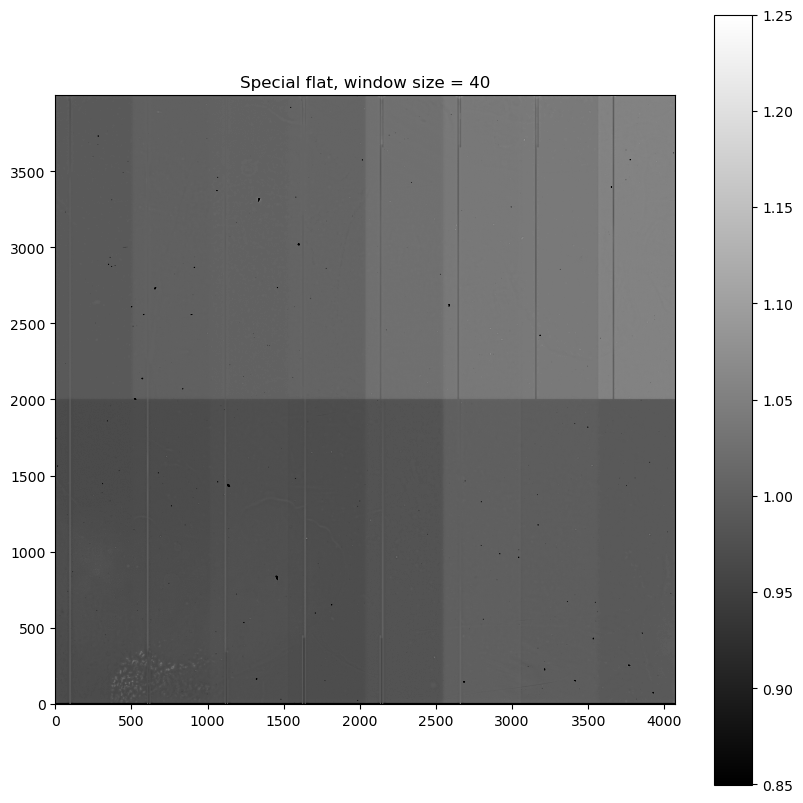

In [94]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
im = ax.imshow(special_array,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())
ax.set_title('Special flat, window size = {0}'.format(window_size))
plt.colorbar(im,ax=ax)
plt.savefig('04_special_flat_ws_{0}.png'.format(window_size))

# Save special flat in fits file 

In [95]:
filename_out = f"flat_{exposure_selected}_{filter_}.fits"
fullfilename_out = os.path.join(outdir,filename_out)

print(f">>>>  output filename {filename_out}")

hdr = fits.Header()
    
for key,value in md.items():
    hdr[str(key)] = value
    

# Be carefull for Spectractor, 2 hdu units are necessary

primary_hdu = fits.PrimaryHDU(header=hdr)
image_hdu = fits.ImageHDU(flat_array)

hdu_list = fits.HDUList([primary_hdu, image_hdu])

hdu_list.writeto(fullfilename_out,overwrite=True)



>>>>  output filename flat_2023021400335_SDSSg_65mm.fits


In [96]:
filename_out = f"special_flat_{exposure_selected}_{filter_}.fits"
fullfilename_out = os.path.join(outdir,filename_out)

print(f">>>>  output filename {filename_out}")

hdr = fits.Header()
    
for key,value in md.items():
    hdr[str(key)] = value
    

# Be carefull for Spectractor, 2 hdu units are necessary

primary_hdu = fits.PrimaryHDU(header=hdr)
image_hdu = fits.ImageHDU(special_array)

hdu_list = fits.HDUList([primary_hdu, image_hdu])

hdu_list.writeto(fullfilename_out,overwrite=True)



>>>>  output filename special_flat_2023021400335_SDSSg_65mm.fits


## Now we focus on C13, where the 0 order and beginning of the 1st order are 

In [43]:
ampli0_name = 'C13'
id0 = np.where(np.array(all_nameimg)==ampli0_name)[0][0]
print(id0)
ampli0 = all_img[id0]

3


In [44]:
ampli0_median = np.median(ampli0.ravel())

In [45]:
ampli0_smooth = smooth_list[id0]

In [46]:
col1 = ampli0[10:row,column1]
col2 = ampli0[10:row,column2]

In [47]:
print(len(col1),len(col2))

290 290


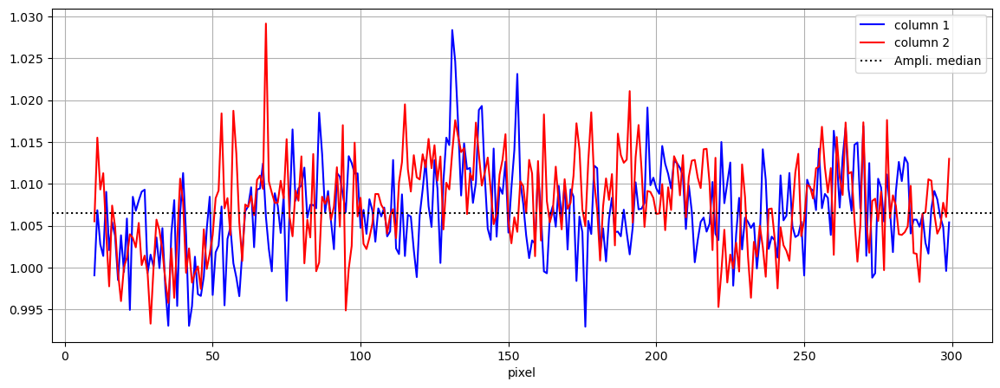

In [48]:
x_ = np.arange(10,10+len(col1))
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(x_,col1,ls='-',color='b',label='column 1')
ax.plot(x_,col2,ls='-',color='r',label='column 2')
ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
ax.grid()
ax.set_xlabel('pixel')
ax.legend(loc="best")

To better see if there is a trend, we bin along the column and compute the median within each bin 

In [49]:
delta_pix = 10

vec_median_ = []
for i in np.arange(0,len(col1),delta_pix):
    vec_median_.append(np.median(col1[i:i+delta_pix]))
vec_median_ = np.array(vec_median_)

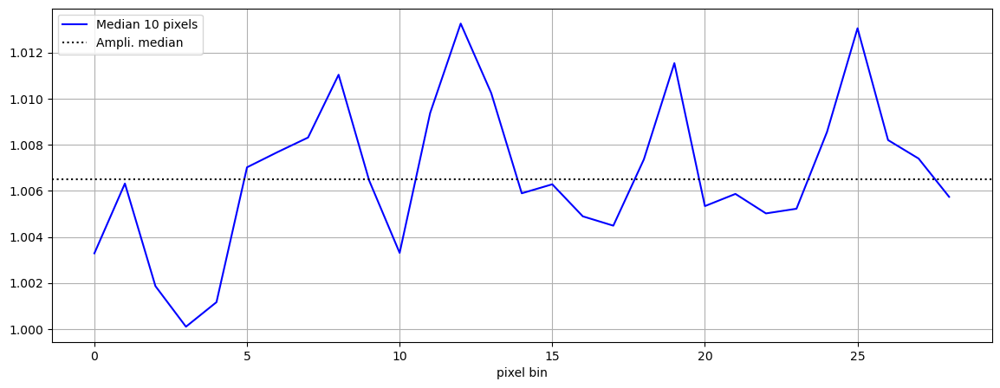

In [50]:
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(np.arange(len(vec_median_)),vec_median_,ls='-',color='b',label='Median {0} pixels'.format(delta_pix))
ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
ax.grid()
ax.set_xlabel('pixel bin')
ax.legend(loc="best")

It doesn't seem to be a clear trend. Let's see what happens if we take a full column: 

In [51]:
full_col = ampli0[10:,column1]
print(len(full_col))

1990


In [52]:
delta_pix = 10

vec_median = []
for i in np.arange(0,len(full_col),delta_pix):
    vec_median.append(np.median(full_col[i:i+delta_pix]))
vec_median = np.array(vec_median)

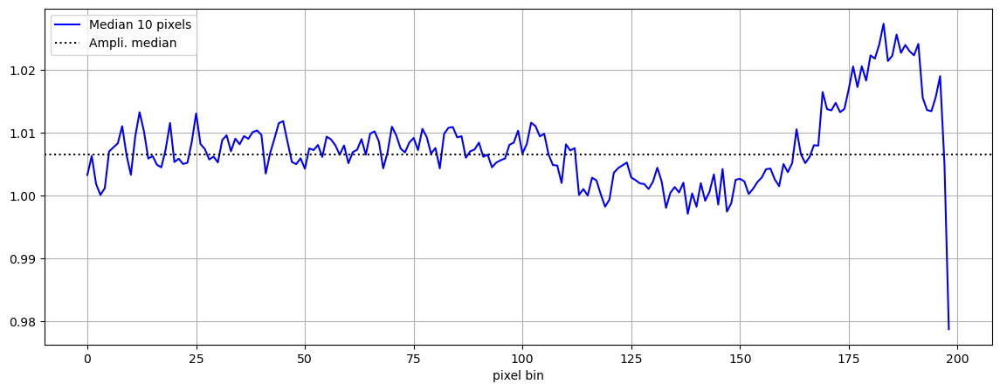

In [53]:
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
ax.plot(np.arange(len(vec_median)),vec_median,ls='-',color='b',label='Median {0} pixels'.format(delta_pix))
ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
ax.grid()
ax.set_xlabel('pixel bin')
ax.legend(loc="best")

There doesn't seem to be a clear trend yet. Let's do the same for a set of columns: 

In [54]:
cols_ = np.arange(200,220)

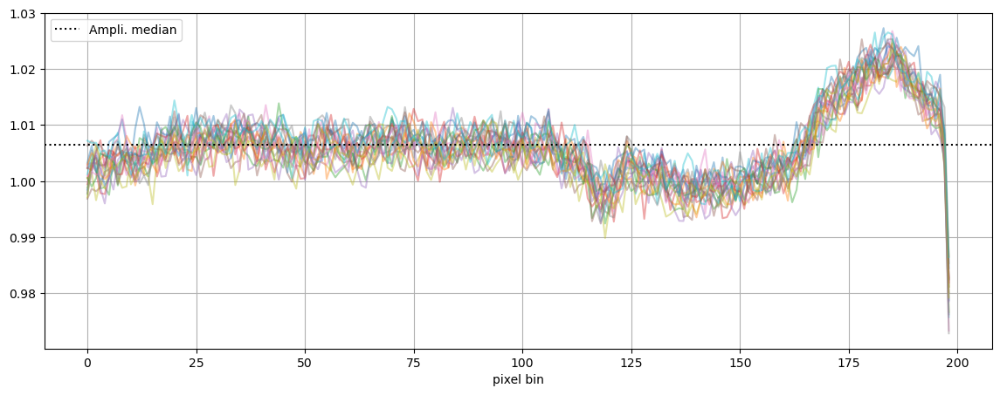

In [55]:
fig = plt.figure(figsize=(14,5))
ax=fig.add_subplot(111)
for icol in cols_:
    col_ = ampli0[10:,icol]
    vec_median_col = []
    for i in np.arange(0,len(col_),delta_pix):
        vec_median_col.append(np.median(col_[i:i+delta_pix]))
    vec_median_col = np.array(vec_median_col)
    ax.plot(np.arange(len(vec_median_col)),vec_median_col,ls='-',alpha=0.4)
ax.axhline(y=ampli0_median,ls=':',color='k',label='Ampli. median')
ax.grid()
ax.set_xlabel('pixel bin')
ax.legend(loc="best")

In [56]:
flat_array.shape

(4000, 4072)

In [57]:
for iampli in mapampid:
    #iampli = mapampid[idx]
    iampli_name = all_nameimg[iampli]
    print(iampli,iampli_name)
    
    amp_data = all_img[iampli]
    amp_median = np.median(all_img[iampli].flatten())
    amp_smooth = smooth_list[iampli]
    amp_result = amp_data*amp_median/amp_smooth
    
    if iampli<=7:
        if iampli==0:
            data_up = amp_result
        else:
            data_up = np.concatenate((data_up,amp_result),axis=1)
    else:
        if iampli==15:
            data_down = amp_result
        else:
            data_down = np.concatenate((data_down,amp_result),axis=1)
data_out = np.concatenate((data_down,data_up),axis=0)
    

0 C10
1 C11
2 C12
3 C13
4 C14
5 C15
6 C16
7 C17
15 C00
14 C01
13 C02
12 C03
11 C04
10 C05
9 C06
8 C07


In [58]:
data_out.shape

(4000, 4072)

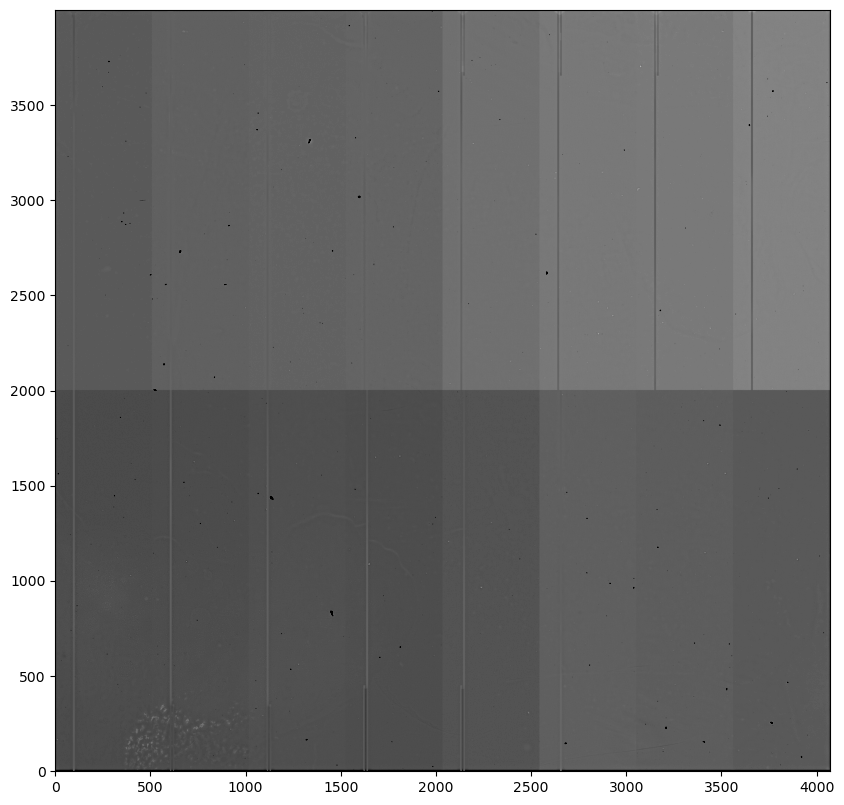

In [59]:
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(111)
ax.imshow(data_out,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())

In [60]:
mapampid

[0, 1, 2, 3, 4, 5, 6, 7, 15, 14, 13, 12, 11, 10, 9, 8]

In [61]:
all_nameimg

['C10',
 'C11',
 'C12',
 'C13',
 'C14',
 'C15',
 'C16',
 'C17',
 'C07',
 'C06',
 'C05',
 'C04',
 'C03',
 'C02',
 'C01',
 'C00']

In [62]:
for iampli in mapampid:
    #iampli = mapampid[idx]
    iampli_name = all_nameimg[iampli]
    print(iampli,iampli_name)
    
    amp_data = all_img[iampli]
    amp_result = amp_data
    
    if iampli<=7:
        print('A')
        if iampli==0:
            data_up = amp_result
        else:
            data_up = np.concatenate((data_up,amp_result),axis=1)
    else:
        print('B')
        if iampli==15:
            data_down = amp_result
        else:
            data_down = np.concatenate((data_down,amp_result),axis=1)
data_out = np.concatenate((data_down,data_up),axis=0)

0 C10
A
1 C11
A
2 C12
A
3 C13
A
4 C14
A
5 C15
A
6 C16
A
7 C17
A
15 C00
B
14 C01
B
13 C02
B
12 C03
B
11 C04
B
10 C05
B
9 C06
B
8 C07
B


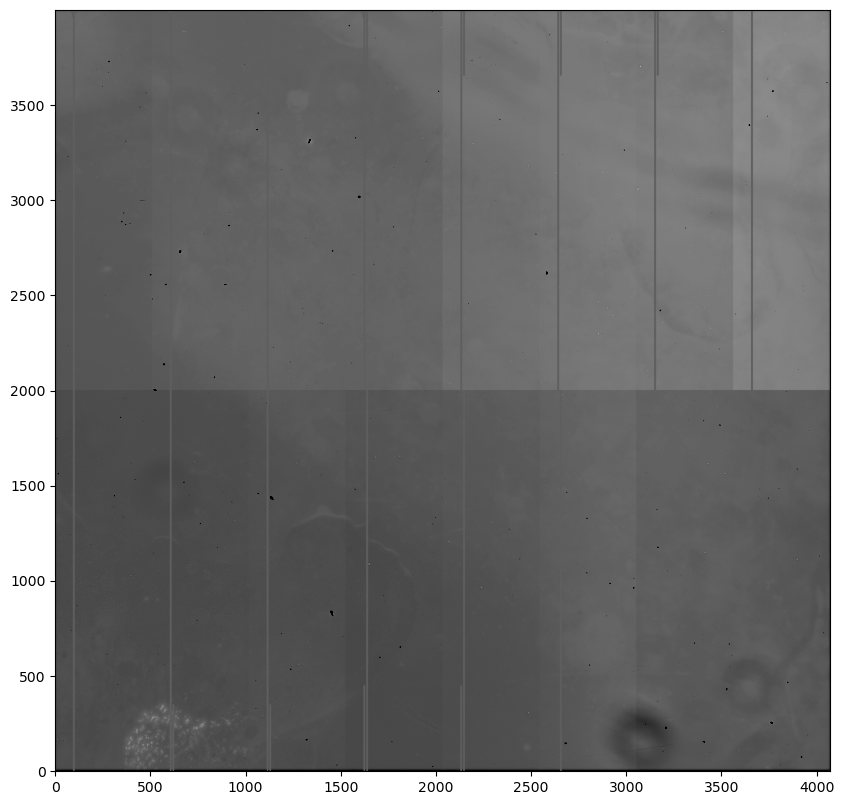

In [63]:
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(111)
ax.imshow(data_out,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())

In [64]:
import pywt
import pywt.data

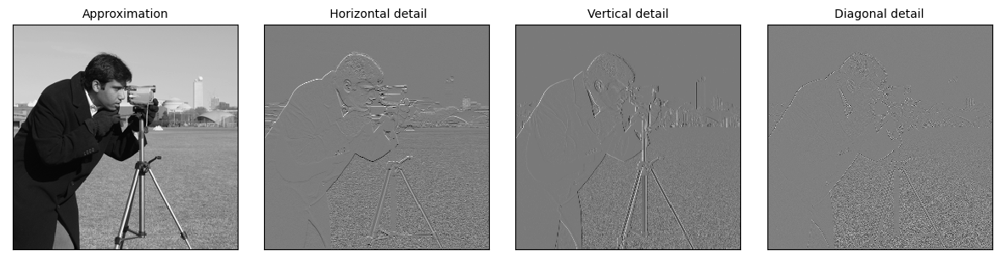

In [65]:
# Load image
original = pywt.data.camera()

# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
coeffs2 = pywt.dwt2(original, 'bior1.3')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 3))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(1, 4, i + 1)
    ax.imshow(a, interpolation="nearest", cmap=plt.cm.gray)
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

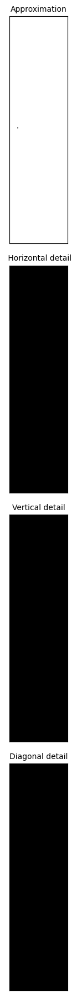

In [66]:
# Wavelet transform of image, and plot approximation and details
titles = ['Approximation', ' Horizontal detail',
          'Vertical detail', 'Diagonal detail']
coeffs2 = pywt.dwt2(ampli0, 'bior1.3')
LL, (LH, HL, HH) = coeffs2
fig = plt.figure(figsize=(12, 18))
for i, a in enumerate([LL, LH, HL, HH]):
    ax = fig.add_subplot(4, 1, i + 1)
    ax.imshow(a, cmap="gray",vmin=0.85,vmax=1.25,origin='lower')
    ax.set_title(titles[i], fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])

fig.tight_layout()
plt.show()

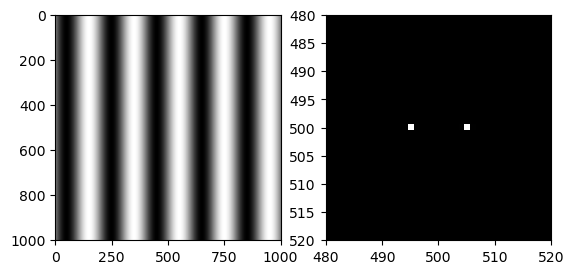

In [67]:
x = np.arange(-500, 501, 1)
X, Y = np.meshgrid(x, x)
wavelength = 200
angle = 0.
grating = np.sin(
    2*np.pi*(X*np.cos(angle) + Y*np.sin(angle)) / wavelength
)
plt.set_cmap("gray")
plt.subplot(121)
plt.imshow(grating)
# Calculate Fourier transform of grating
ft = np.fft.ifftshift(grating)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)

plt.subplot(122)
plt.imshow(abs(ft))
plt.xlim([480, 520])
plt.ylim([520, 480])  # Note, order is reversed for y
plt.show()

In [68]:
X

array([[-500, -499, -498, ...,  498,  499,  500],
       [-500, -499, -498, ...,  498,  499,  500],
       [-500, -499, -498, ...,  498,  499,  500],
       ...,
       [-500, -499, -498, ...,  498,  499,  500],
       [-500, -499, -498, ...,  498,  499,  500],
       [-500, -499, -498, ...,  498,  499,  500]])

In [69]:
flat_img.getDetector()[0].getBBox()

Box2I(corner=Point2I(0, 2000), dimensions=Extent2I(509, 2000))

In [70]:
ampExp = flat_img.Factory(flat_img, amp.getBBox())
ampExp.getBBox()

Box2I(corner=Point2I(0, 0), dimensions=Extent2I(509, 2000))

In [71]:
amp.getName()

'C00'

In [72]:
ampIdx = 9
amp = flat_img.getDetector()[ampIdx]

In [73]:
ampExp = flat_img.Factory(flat_img, amp.getBBox())
amp_img = ampExp.getImage().array

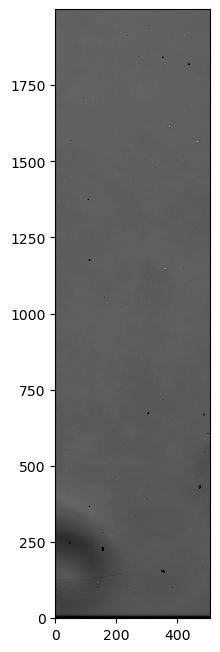

In [74]:
fig = plt.figure(figsize=(2,8))
ax=fig.add_subplot(111)
ax.imshow(amp_img,cmap="gray",vmin=0.85,vmax=1.25,origin='lower')#,norm=LogNorm())

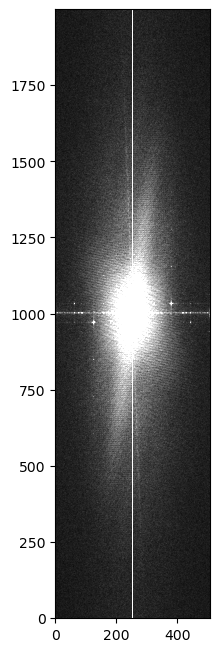

In [75]:
fig = plt.figure(figsize=(2,8))
ax=fig.add_subplot(111)
ft = np.fft.ifftshift(amp_img)
ft = np.fft.fft2(ft)
ft = np.fft.fftshift(ft)
ax.imshow(abs(ft),cmap="gray",vmin=0.65,vmax=25.5,origin='lower')

In [76]:
abs(ft)

array([[2.67466844, 2.96927985, 1.76998328, ..., 1.76998328, 2.96927985,
        2.67466844],
       [7.00292017, 1.40690047, 2.05579645, ..., 3.56629034, 3.23942411,
        1.32003367],
       [2.29851846, 1.36559211, 4.89056185, ..., 4.04877899, 3.8844761 ,
        2.17605823],
       ...,
       [5.00060036, 0.6441046 , 3.84106792, ..., 5.15290231, 4.15813583,
        3.68968162],
       [2.17605823, 3.8844761 , 4.04877899, ..., 4.89056185, 1.36559211,
        2.29851846],
       [1.32003367, 3.23942411, 3.56629034, ..., 2.05579645, 1.40690047,
        7.00292017]])

In [77]:
amp_img.shape

(2000, 509)

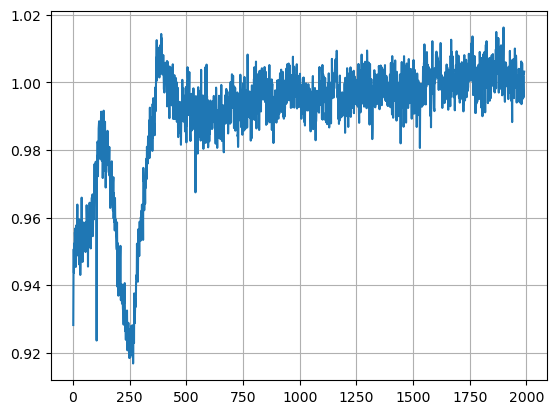

In [78]:
col = amp_img[10:,20]
pix = np.arange(len(col))+1
plt.plot(pix,col)
plt.grid()

In [79]:
ft1 = np.fft.ifftshift(col)
ft1 = np.fft.fft(ft1)
ft1 = np.fft.fftshift(ft1)

In [80]:
ft1

array([-0.01641887+1.38777878e-17j,  0.21624862+1.41774085e-01j,
       -0.00842204-5.19332098e-02j, ...,  0.12601366+2.64321744e-02j,
       -0.00842204+5.19332098e-02j,  0.21624862-1.41774085e-01j])

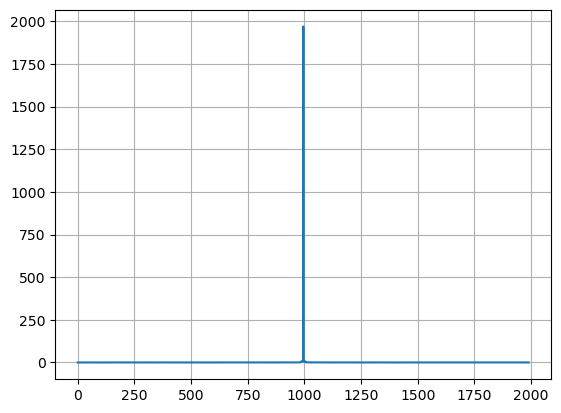

In [81]:
plt.plot(abs(ft1))
plt.grid()
#plt.xlim(0.,0.2)
#plt.ylim(0.,5.)

In [82]:
from scipy.fft import fft, fftfreq, fftshift

In [83]:
fourier = fft(col)

In [84]:
fourier

array([ 1.9702704e+03 -0.j      , -8.6371965e+00 +9.832541j,
       -3.7501137e+00+10.433126j, ...,  4.7759488e-02 -8.822927j,
       -3.7501137e+00-10.433126j, -8.6371965e+00 -9.832541j],
      dtype=complex64)

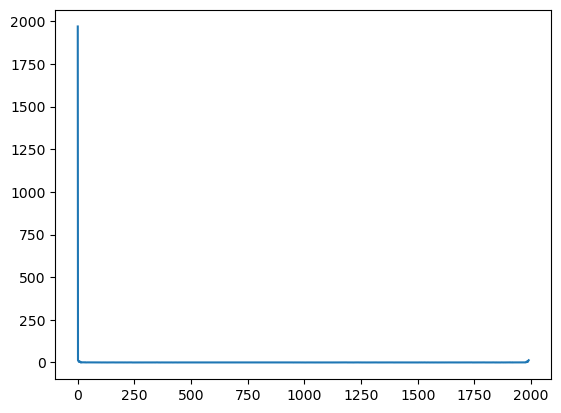

In [85]:
plt.plot(np.abs(fourier))

In [86]:
len(col)

1990

In [87]:
len(fourier)

1990

In [88]:
x = np.arange(1001)+1.
step = np.zeros(1001)
step[400:600] = 1.

In [89]:
x

array([1.000e+00, 2.000e+00, 3.000e+00, ..., 9.990e+02, 1.000e+03,
       1.001e+03])

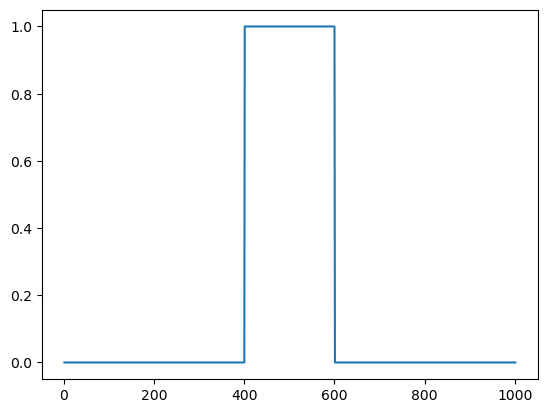

In [90]:
plt.plot(x,step)

In [91]:
fstep = fft(step)

In [92]:
freq = fftfreq(len(step),1./(2.*len(step)))

In [93]:
freq = fftshift(freq)

In [94]:
fstep_plot = fftshift(fstep)

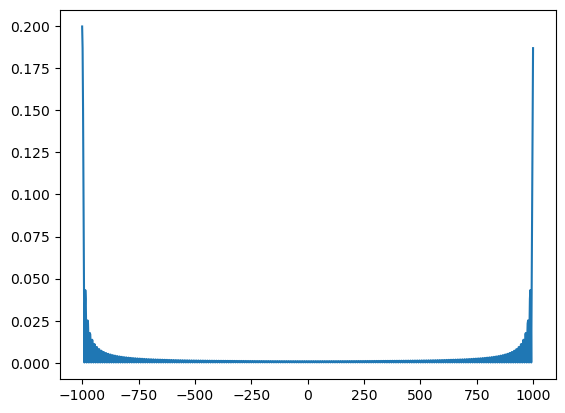

In [95]:
plt.plot(freq,np.abs(fstep)/len(step))

In [96]:
x

array([1.000e+00, 2.000e+00, 3.000e+00, ..., 9.990e+02, 1.000e+03,
       1.001e+03])

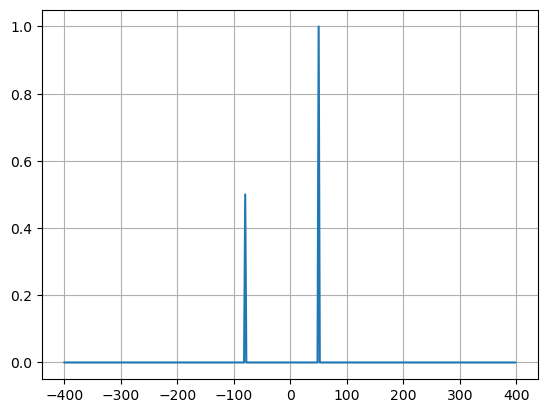

In [97]:
# number of signal points

N = 400

# sample spacing

T = 1.0 / 800.0

x = np.linspace(0.0, N*T, N, endpoint=False)

y = np.exp(50.0 * 1.j * 2.0*np.pi*x) + 0.5*np.exp(-80.0 * 1.j * 2.0*np.pi*x)

yf = fft(y)

xf = fftfreq(N, T)

xf = fftshift(xf)

yplot = fftshift(yf)

import matplotlib.pyplot as plt

plt.plot(xf, 1.0/N * np.abs(yplot))

plt.grid()

plt.show()